In [ ]:
# AUTO_BOOTSTRAP_V2
from pathlib import Path
import sys
import os
import builtins
import numpy as np
import pandas as pd

ROOT = Path.cwd()
if not (ROOT / "projects").exists():
    cur = Path.cwd().resolve()
    for p in [cur] + list(cur.parents):
        if (p / "projects").exists():
            ROOT = p
            break

NB_PATH = Path.cwd()
if "clone_motif" in str(NB_PATH):
    PROJECT_DIR = ROOT / "projects" / "clone_motif"
else:
    PROJECT_DIR = ROOT / "projects" / "our_multiregion_motif"

DATA_RAW = PROJECT_DIR / "data" / "raw"
DATA_PROCESSED = PROJECT_DIR / "data" / "processed"
OUT_FIG = PROJECT_DIR / "outputs" / "figures"
OUT_TABLE = PROJECT_DIR / "outputs" / "tables"
OUT_ARCH = PROJECT_DIR / "outputs" / "archives"

for d in [DATA_PROCESSED, OUT_FIG, OUT_TABLE, OUT_ARCH]:
    d.mkdir(parents=True, exist_ok=True)

SHARED_SRC = ROOT / "projects" / "shared" / "src"
if str(SHARED_SRC) not in sys.path:
    sys.path.append(str(SHARED_SRC))

from motif_common import combination, indices_for_region, union_indices_for_regions, p_to_star, format_p_decimal_3sig, sort_by_order, truncate_colormap

READ_EXT = {".csv", ".json", ".npy", ".pkl", ".xlsx"}
FIG_EXT = {".svg", ".png", ".pdf"}
TABLE_EXT = {".csv", ".xlsx"}


def _as_path(x):
    return Path(x) if isinstance(x, (str, os.PathLike)) else x


def resolve_read_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute() or p.exists():
        return str(p)
    if p.suffix.lower() in READ_EXT:
        for c in [DATA_RAW / p.name, ROOT / p.name]:
            if c.exists():
                return str(c)
    return str(p)


def resolve_write_path(path):
    p = _as_path(path)
    if not isinstance(p, Path):
        return path
    if p.is_absolute():
        p.parent.mkdir(parents=True, exist_ok=True)
        return str(p)
    ext = p.suffix.lower()
    if ext in FIG_EXT:
        out = OUT_FIG / p.name
    elif ext in TABLE_EXT:
        out = OUT_TABLE / p.name
    elif ext == ".zip":
        out = OUT_ARCH / p.name
    elif ext == ".npy":
        out = DATA_PROCESSED / p.name
    else:
        out = PROJECT_DIR / p
    out.parent.mkdir(parents=True, exist_ok=True)
    return str(out)

if not hasattr(builtins, "_orig_open_codex"):
    builtins._orig_open_codex = builtins.open


def _open_patch(file, mode="r", *args, **kwargs):
    if isinstance(file, (str, os.PathLike)):
        if any(m in mode for m in ["r", "a"]):
            file = resolve_read_path(file)
        if any(m in mode for m in ["w", "a", "x"]):
            file = resolve_write_path(file)
    return builtins._orig_open_codex(file, mode, *args, **kwargs)


builtins.open = _open_patch

if not hasattr(np, "_orig_load_codex"):
    np._orig_load_codex = np.load
np.load = lambda file, *a, **k: np._orig_load_codex(resolve_read_path(file), *a, **k)

if not hasattr(np, "_orig_save_codex"):
    np._orig_save_codex = np.save
np.save = lambda file, arr, *a, **k: np._orig_save_codex(resolve_write_path(file), arr, *a, **k)

if not hasattr(pd, "_orig_read_csv_codex"):
    pd._orig_read_csv_codex = pd.read_csv
pd.read_csv = lambda f, *a, **k: pd._orig_read_csv_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd, "_orig_read_excel_codex"):
    pd._orig_read_excel_codex = pd.read_excel
pd.read_excel = lambda f, *a, **k: pd._orig_read_excel_codex(resolve_read_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)

if not hasattr(pd.DataFrame, "_orig_to_csv_codex"):
    pd.DataFrame._orig_to_csv_codex = pd.DataFrame.to_csv


def _to_csv_patch(self, path_or_buf=None, *args, **kwargs):
    if isinstance(path_or_buf, (str, os.PathLike)):
        path_or_buf = resolve_write_path(path_or_buf)
    return pd.DataFrame._orig_to_csv_codex(self, path_or_buf, *args, **kwargs)


pd.DataFrame.to_csv = _to_csv_patch

if not hasattr(pd.DataFrame, "_orig_to_excel_codex"):
    pd.DataFrame._orig_to_excel_codex = pd.DataFrame.to_excel


def _to_excel_patch(self, excel_writer, *args, **kwargs):
    if isinstance(excel_writer, (str, os.PathLike)):
        excel_writer = resolve_write_path(excel_writer)
    return pd.DataFrame._orig_to_excel_codex(self, excel_writer, *args, **kwargs)


pd.DataFrame.to_excel = _to_excel_patch

try:
    import matplotlib.pyplot as plt
    if not hasattr(plt, "_orig_savefig_codex"):
        plt._orig_savefig_codex = plt.savefig
    plt.savefig = lambda f, *a, **k: plt._orig_savefig_codex(resolve_write_path(f) if isinstance(f, (str, os.PathLike)) else f, *a, **k)
except Exception:
    pass

print(f"[bootstrap] project={PROJECT_DIR.name} data={DATA_RAW}")


/opt/miniconda3/envs/population_paper/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


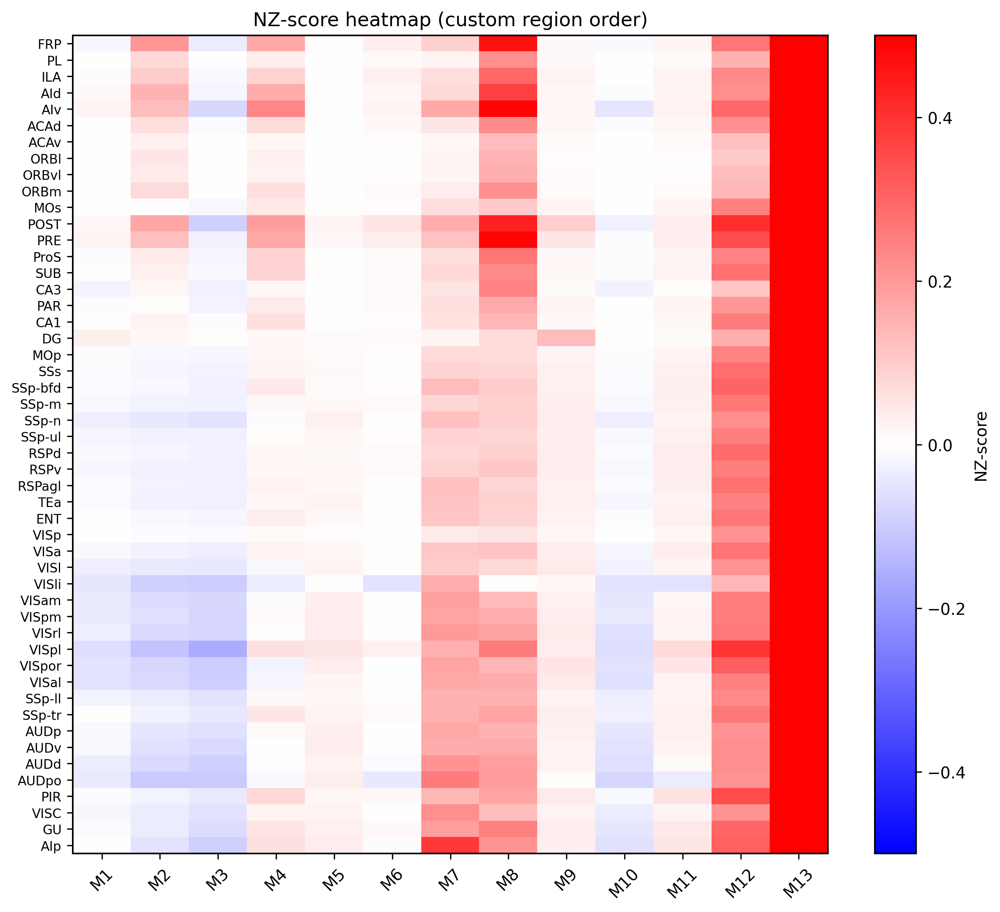

In [ ]:
import pickle
import numpy as np
import umap
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, optimal_leaf_ordering, dendrogram
from scipy.spatial.distance import pdist

import matplotlib as mpl

# ===== 提升整体分辨率 & 字体 =====
mpl.rcParams['figure.dpi'] = 300        # 屏幕显示分辨率
mpl.rcParams['savefig.dpi'] = 300       # 保存图片分辨率
mpl.rcParams['figure.figsize'] = (6, 4)
mpl.rcParams['font.size'] = 10
mpl.rcParams['axes.linewidth'] = 1.0
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

# ==================== 1. 加载 & 提取数据 ====================
with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    data = pickle.load(f)["results"][5]

NZ, names, nodes, spars = [], [], [], []
for r, info in data.items():
    # 过滤掉不用的区域
    if r in {"SSp", "VPL", "PERI", "ECT", "PO", "PR"}:
        continue
    mr = info["motif_results"].get("0")
    if mr and (nz := np.asarray(mr["NZ"], float)).shape[0] == 13:
        names.append(r)
        NZ.append(nz)
        nodes.append(mr["node"])
        spars.append(mr["sparsity"])

NZ = np.vstack(NZ)
names = np.array(names)
nodes = np.array(nodes)
spars = np.array(spars, float)

# ==================== 2. UMAP + 聚类（这里只用来算 Z）====================
emb = umap.UMAP(
    n_neighbors=15,
    min_dist=0.15,
    metric='cosine',
    random_state=1
).fit_transform(NZ)

Z = optimal_leaf_ordering(linkage(emb, "ward"), pdist(emb))


# ==================== 3. 按你给的 cluster 顺序重排 ====================

# ---- 你给的 4 个 cluster 顺序 ----
cluster1_names = [
    "FRP",
    "PL",
    "ILA",
    "AId",
    "AIv",
    "ACAd",
    "ACAv",
    "ORBl",
    "ORBvl",
    "ORBm",
    "MOs",
]

cluster2_names = [
    "POST",
    "PRE",
    "ProS",
    "SUB",
    "CA3",
    "PAR",
    "CA1",
    "DG",
]

cluster3_names = [
    "MOp",
    "SSs",
    "SSp-bfd",
    "SSp-m",
    "SSp-n",
    "SSp-ul",
    "RSPd",
    "RSPv",
    "RSPagl",
    "TEa",
    "ENT",
    "VISp",
    "VISa",
    "VISl",
    "VISli",
]

cluster4_names = [
    "VISam",
    "VISpm",
    "VISrl",
    "VISpl",
    "VISpor",
    "VISal",
    "SSp-ll",
    "SSp-tr",
    "AUDp",
    "AUDv",
    "AUDd",
    "AUDpo",
    "PIR",
    "VISC",
    "GU",
    "AIp",
]

# 合并成一个总顺序
custom_order_names = (
    cluster1_names +
    cluster2_names +
    cluster3_names +
    cluster4_names
)

# 建一个 name -> index 映射
name_to_idx = {r: i for i, r in enumerate(names)}

# 检查一下是否有名字对不上
missing = [r for r in custom_order_names if r not in name_to_idx]
extra   = [r for r in names if r not in custom_order_names]

if missing:
    print("[WARN] 这些区域在数据里找不到，会被忽略:", missing)
if extra:
    print("[WARN] 数据里还有这些区域不在你给的顺序里，会按原顺序附加在最后:", extra)
# 先按照你给的顺序挑出确实存在的
ordered_names_list = [r for r in custom_order_names if r in name_to_idx]
# 再把剩下的（如果有的话）按原顺序放在最后
ordered_names_list += [r for r in names if r not in ordered_names_list]

# 这就是你后续要用的“统一顺序”（按名字）
region_order = ordered_names_list  # <-- 以后你可以直接用这个 list

# 把它转换成索引顺序
order = np.array([name_to_idx[r] for r in region_order], dtype=int)


# 自定义 cluster 标签（1~4），按名字映射
name_to_cluster = {}
for r in cluster1_names:
    name_to_cluster[r] = 1
for r in cluster2_names:
    name_to_cluster[r] = 2
for r in cluster3_names:
    name_to_cluster[r] = 3
for r in cluster4_names:
    name_to_cluster[r] = 4

# 对没有出现在 4 个列表里的（如果有），给个 0 类
labels = np.array([name_to_cluster.get(r, 0) for r in names])

# 按新顺序重排所有数组
NZ     = sort_by_order(NZ)
names  = sort_by_order(names)
nodes  = sort_by_order(nodes)
spars  = sort_by_order(spars)
labels = sort_by_order(labels)
emb    = sort_by_order(emb)


# ==================== 图3：NZ-score 热图 ====================
plt.figure(figsize=(9, 8))
im = plt.imshow(NZ, aspect='auto', cmap='bwr', vmin=-0.5, vmax=0.5)
plt.colorbar(im, label="NZ-score")

# y 轴用当前 names（已经是按你给的顺序排好的）
plt.yticks(range(len(names)), names, fontsize=8)
plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)
plt.title("NZ-score heatmap (custom region order)")
plt.tight_layout()
# plt.savefig("3.nz_score_heatmap.svg",
#             bbox_inches='tight', dpi=300, transparent=True)
plt.show()

In [49]:
data['MOp']['motif_results']['0.1']['str_threshold']

1.18958181142807

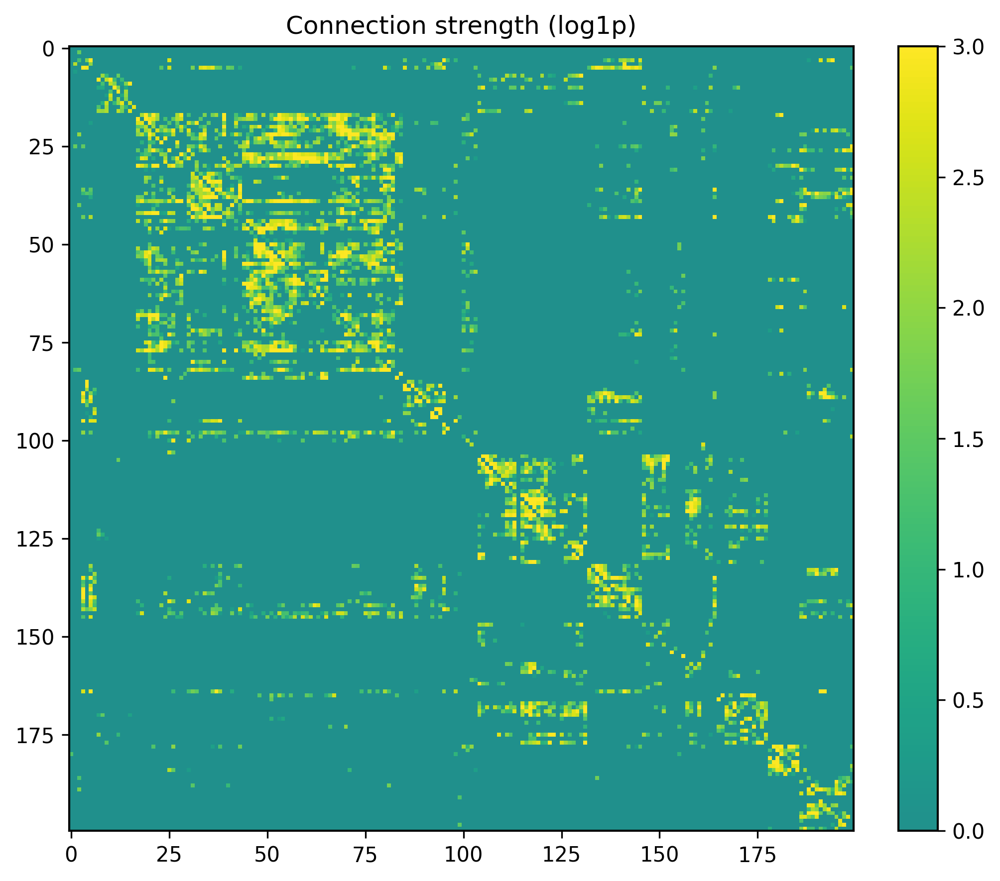

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    data = pickle.load(f)["results"][5]
W = np.asarray(data['MOp']['sc'])[400:600,400:600]
W_log = np.log1p(W)

plt.figure(figsize=(8, 6))

# 使用中等偏浅的部分
cmap4 = truncate_colormap(plt.cm.viridis, 0.5,1)
im4 = plt.imshow(W_log, aspect='equal', interpolation='nearest',vmax=3, cmap=cmap4)
plt.colorbar(im4, fraction=0.046, pad=0.04)
plt.title("Connection strength (log1p)")
plt.savefig("Connection strength (log1p,200neurons).svg", bbox_inches='tight',  dpi=300, transparent=True)

plt.tight_layout()
plt.show()

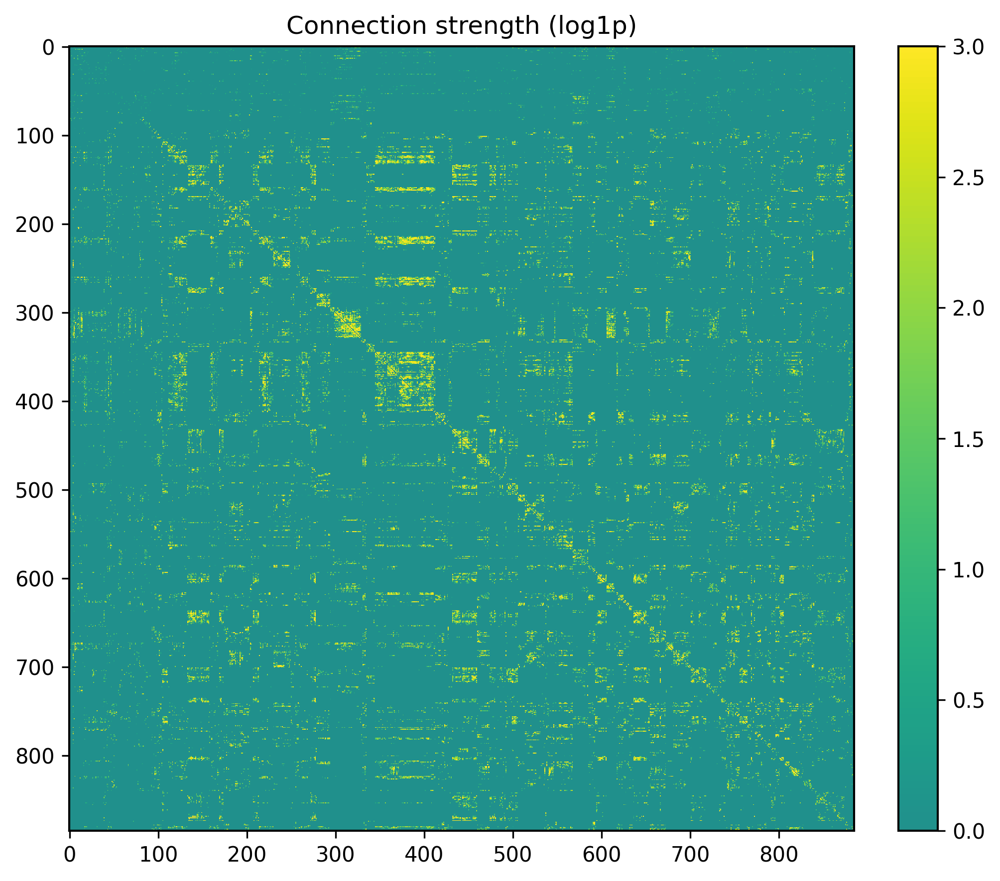

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


W = np.asarray(data['MOp']['sc'])[72:,72:]
W_log = np.log1p(W)

plt.figure(figsize=(8, 6))

# 使用中等偏浅的部分
cmap4 = truncate_colormap(plt.cm.viridis, 0.5,1)
im4 = plt.imshow(W_log, aspect='equal', interpolation='nearest',vmax=3, cmap=cmap4)
plt.colorbar(im4, fraction=0.046, pad=0.04)
plt.title("Connection strength (log1p)")
plt.savefig("Connection strength (log1p,900neurons).svg", bbox_inches='tight',  dpi=300, transparent=True)

plt.tight_layout()
plt.show()

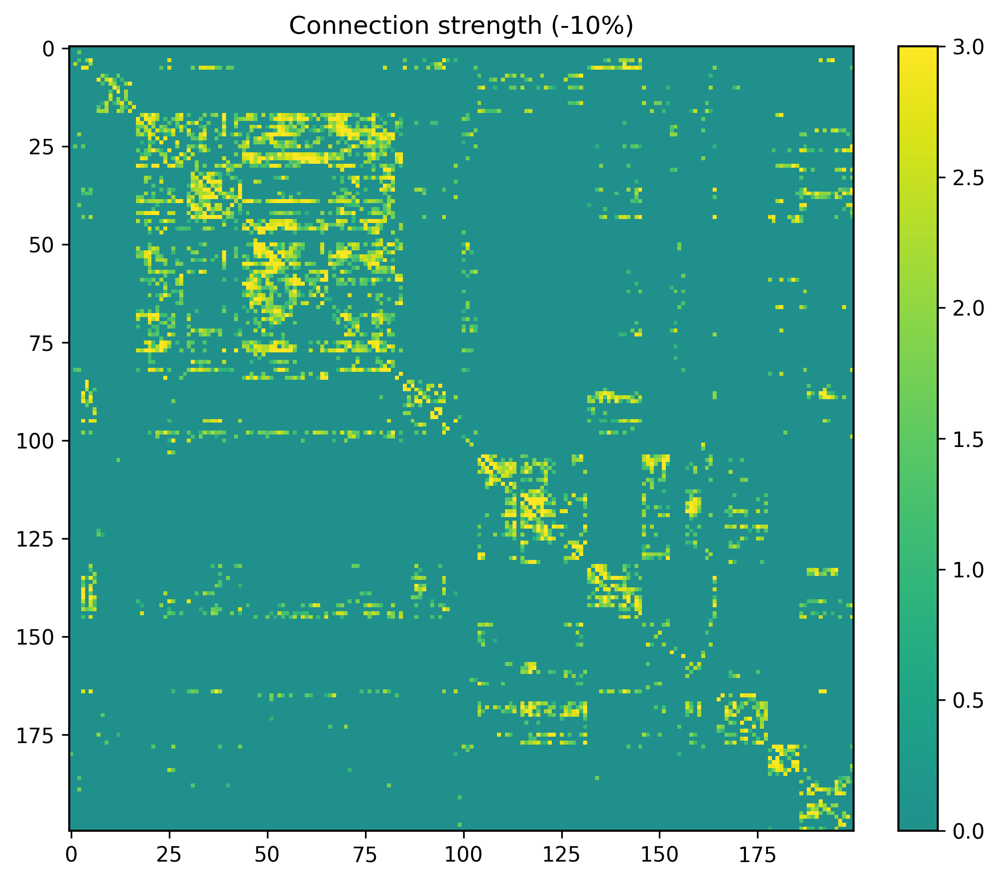

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


W = np.asarray(data['MOp']['sc'])[400:600, 400:600].astype(float)

# ✅ 原始阈值：小于 0.01 的连接置 0
thr = data['MOp']['motif_results']['0.1']['str_threshold']
W[W < thr] = 0.0   # 如果你想按绝对值阈值，用下一行替换：
# W[np.abs(W) < thr] = 0.0

W_log = np.log1p(W)

plt.figure(figsize=(8, 6))

cmap4 = truncate_colormap(plt.cm.viridis, 0.5, 1.0)
im4 = plt.imshow(W_log, aspect='equal', interpolation='nearest', vmax=3, cmap=cmap4)
plt.colorbar(im4, fraction=0.046, pad=0.04)
plt.title(f"Connection strength (-10%)")

plt.tight_layout()
plt.show()

In [ ]:
data['MOp']['motif_results']['0.4']['str_threshold']


3.571805953979492

In [90]:
import numpy as np

W = np.asarray(data['MOp']['sc'])[72:, 72:]

mask = (W != 0) & np.isfinite(W)
min_nonzero = np.min(W[mask]) if np.any(mask) else None
print("min(W | W!=0) =", min_nonzero)

sum(W[W<1.0])

min(W | W!=0) = 3.5718691


0.0

In [ ]:
W = np.asarray(data['MOp']['sc'])




0.0

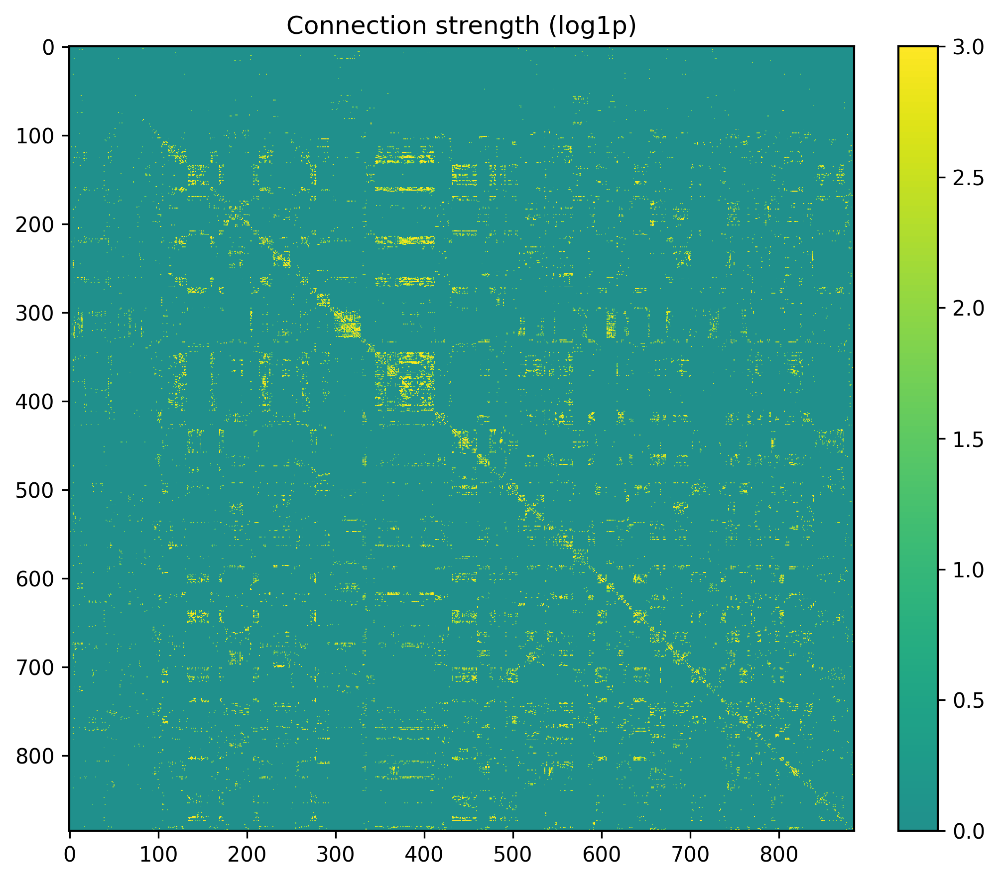

In [61]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors


W = np.asarray(data['MOp']['sc'])[72:,72:]

thr = data['MOp']['motif_results']['0.4']['str_threshold']
W[W < thr] = 0.0 

W_log = np.log1p(W)

plt.figure(figsize=(8, 6))

# 使用中等偏浅的部分
cmap4 = truncate_colormap(plt.cm.viridis, 0.5,1)
im4 = plt.imshow(W_log, aspect='equal', interpolation='nearest',vmax=3, cmap=cmap4)
plt.colorbar(im4, fraction=0.046, pad=0.04)
plt.title("Connection strength (log1p)")
plt.savefig("Connection strength (log1p,900neurons).svg", bbox_inches='tight',  dpi=300, transparent=True)

plt.tight_layout()
plt.show()

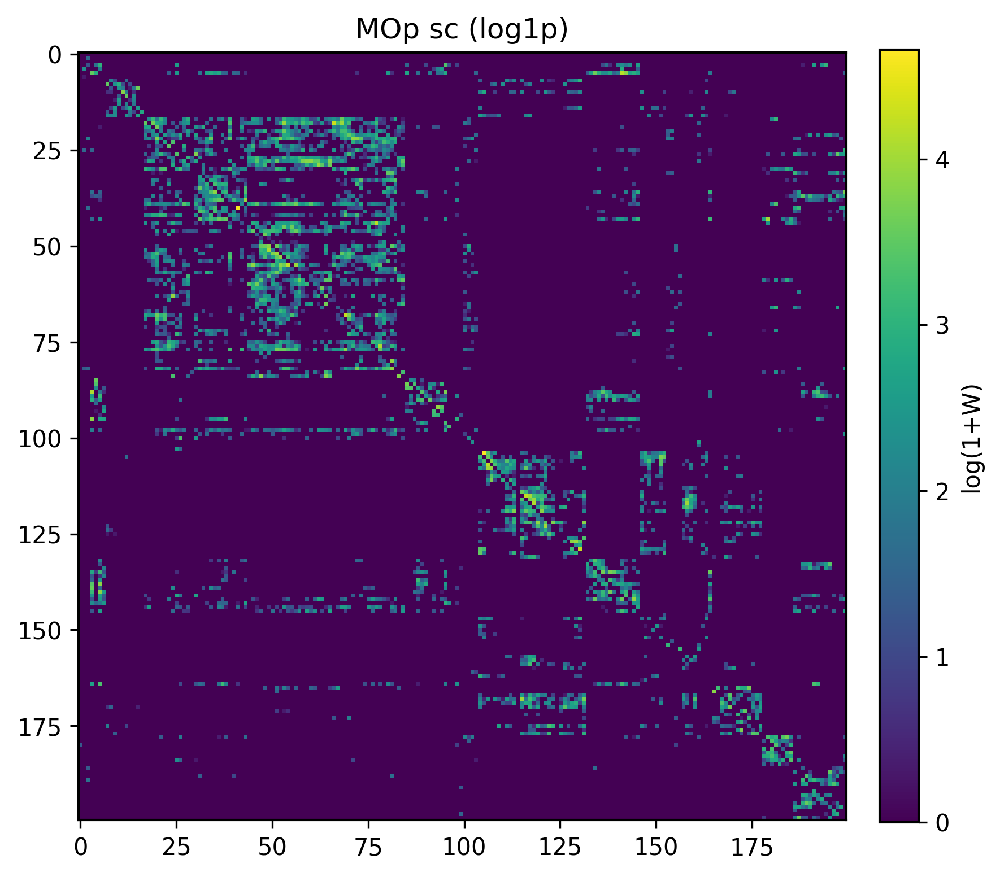

In [31]:
import numpy as np
import matplotlib.pyplot as plt

W = np.asarray(data['MOp']['sc'])[400:600,400:600]#[72:,72:]
W_log = np.log1p(W)  # 等价 log(1+W)

plt.figure(figsize=(6,6))
im = plt.imshow(W_log, aspect='equal', interpolation='nearest')
plt.colorbar(im, fraction=0.046, pad=0.04, label="log(1+W)")
plt.title("MOp sc (log1p)")
plt.tight_layout()
plt.show()

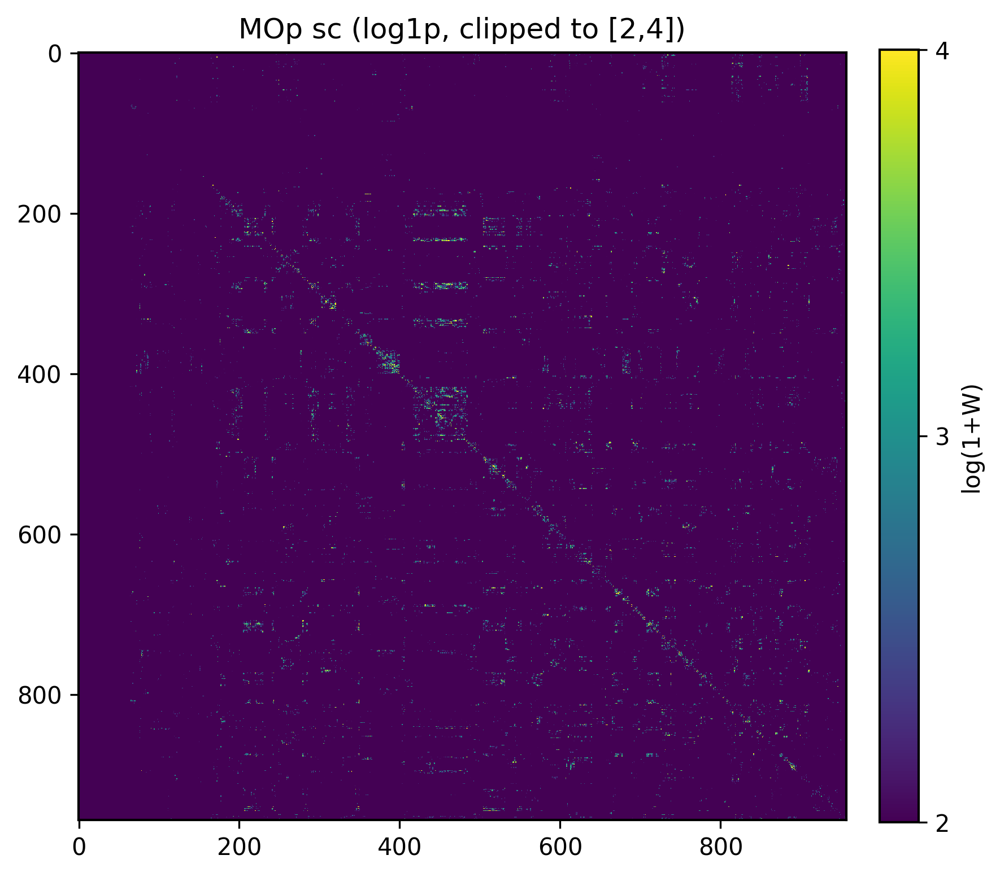

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

W = np.asarray(data['MOp']['sc'])
W_log = np.log1p(W)   # 你现在这张图就是用这个

fig, ax = plt.subplots(figsize=(6, 6))

norm = Normalize(vmin=2, vmax=4, clip=True)  # <2 -> 2 的颜色；>4 -> 4 的颜色
im = ax.imshow(W_log, aspect='equal', interpolation='nearest', norm=norm)

cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label("log(1+W)")
cbar.set_ticks([2, 3, 4])  # 让色条从2开始显示

ax.set_title("MOp sc (log1p, clipped to [2,4])")
fig.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

W = np.asarray(data['MOp']['sc'])[72:,72:]
W_log = np.log1p(W)  # 等价 log(1+W)

plt.figure(figsize=(6,6))
im = plt.imshow(W_log, aspect='equal', interpolation='nearest')
plt.colorbar(im, fraction=0.046, pad=0.04, label="log(1+W)")
plt.title("MOp sc (log1p)")
plt.tight_layout()
plt.show()

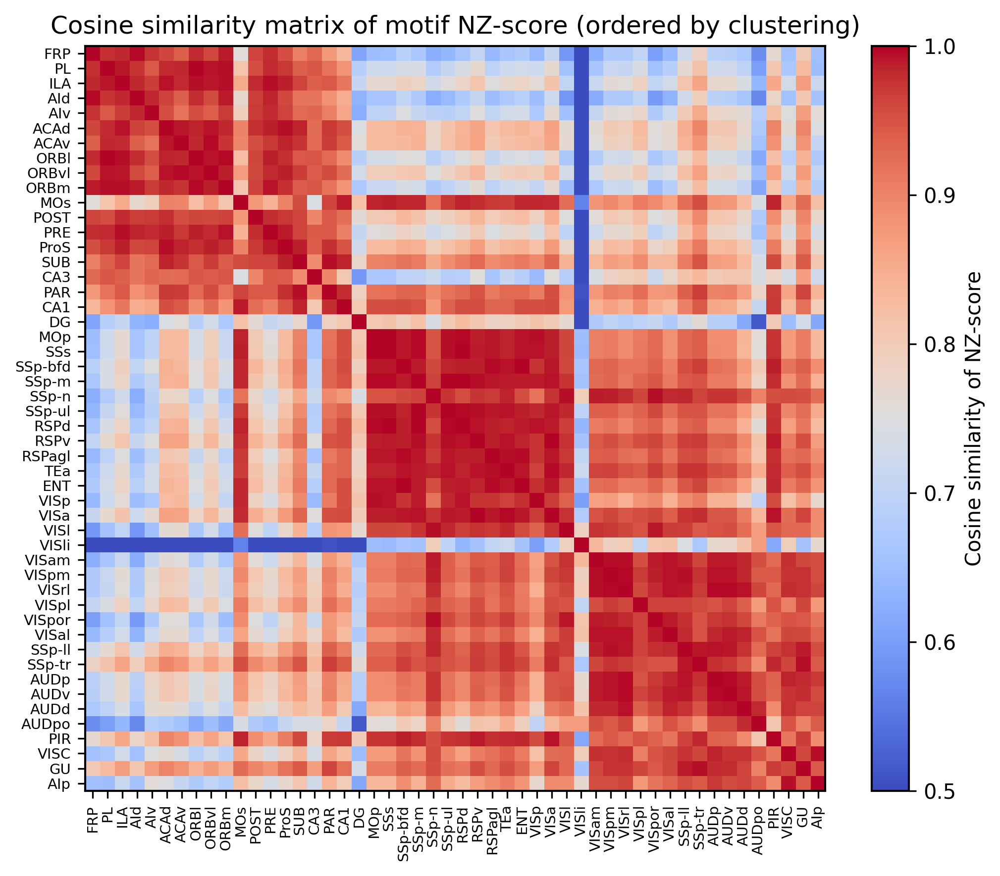

In [4]:
# ==================== 图1.5：NZ-score 余弦相似度矩阵 ====================
# NZ 已经是排好序的 (n_region, 13)，而且每行是 L2 归一化过的
# 余弦相似度 = 向量点积
# 只用前 12 个 motif 计算余弦相似度
X = NZ[:, :12]                                # (n_region, 12)
norms = np.linalg.norm(X, axis=1, keepdims=True)  # 每个脑区的 12 维范数
X_norm = X / norms                            # 行归一化到 L2=1

cos_sim = X_norm @ X_norm.T                  # (n_region, n_region)，真正的 cosine similarity
plt.figure(figsize=(7, 6))
im = plt.imshow(cos_sim, aspect="auto", cmap="coolwarm", vmin=0.5, vmax=1)
plt.colorbar(im, label="Cosine similarity of NZ-score")

plt.xticks(range(len(names)), names, rotation=90, fontsize=7)
plt.yticks(range(len(names)), names, fontsize=7)

plt.title("Cosine similarity matrix of motif NZ-score (ordered by clustering)")
plt.tight_layout()
plt.savefig("4.cosine_similarity_matrix.svg", bbox_inches='tight',  dpi=300, transparent=True)
plt.show()

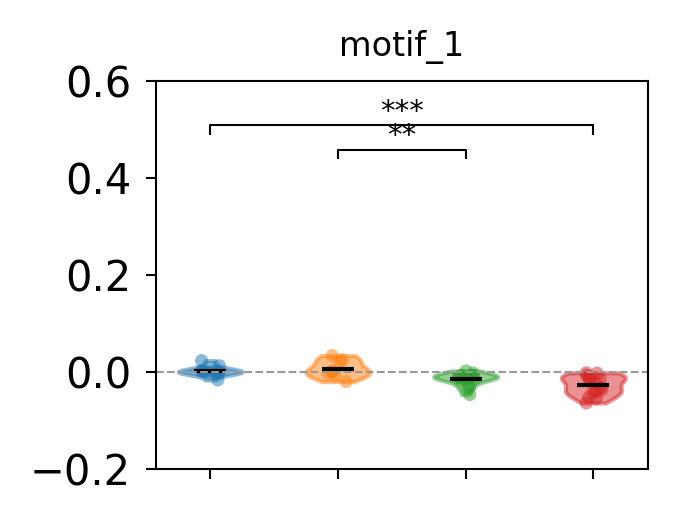

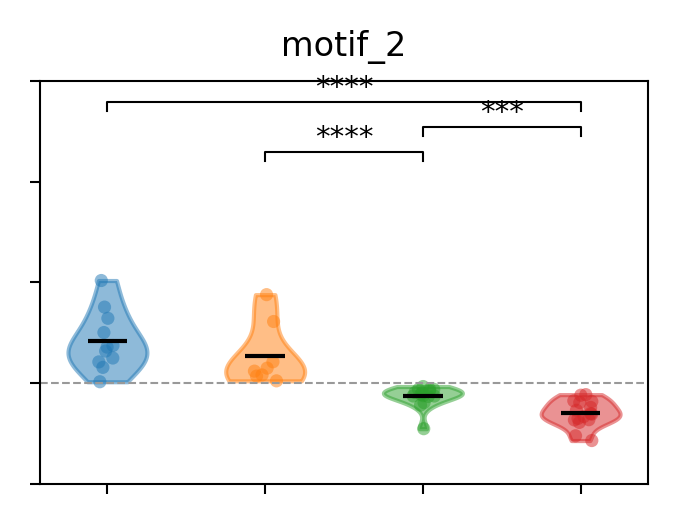

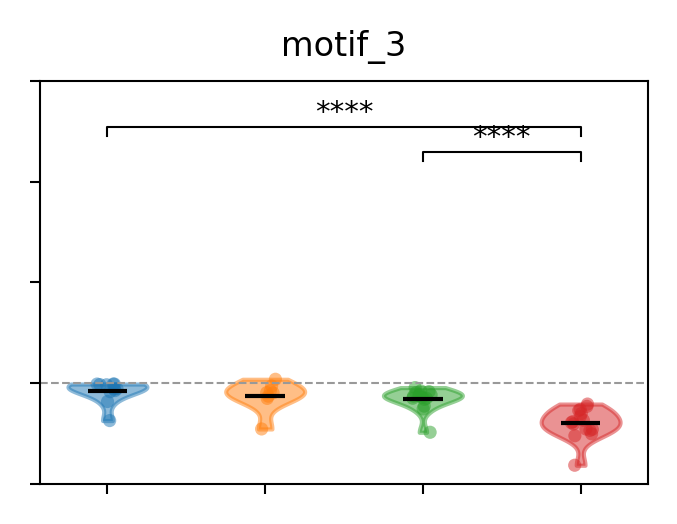

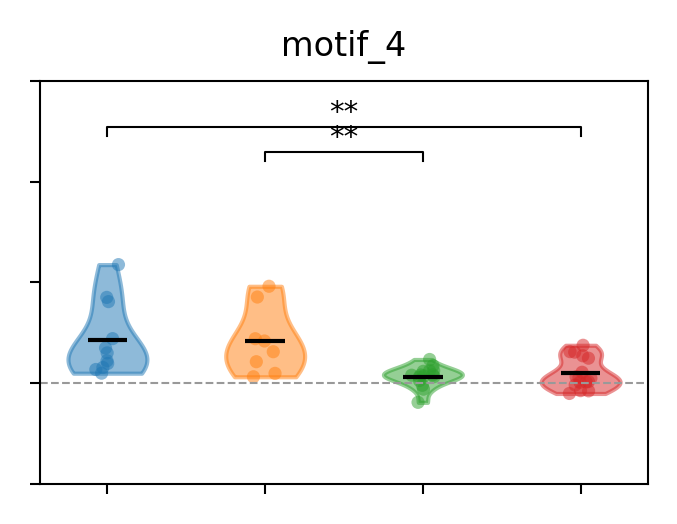

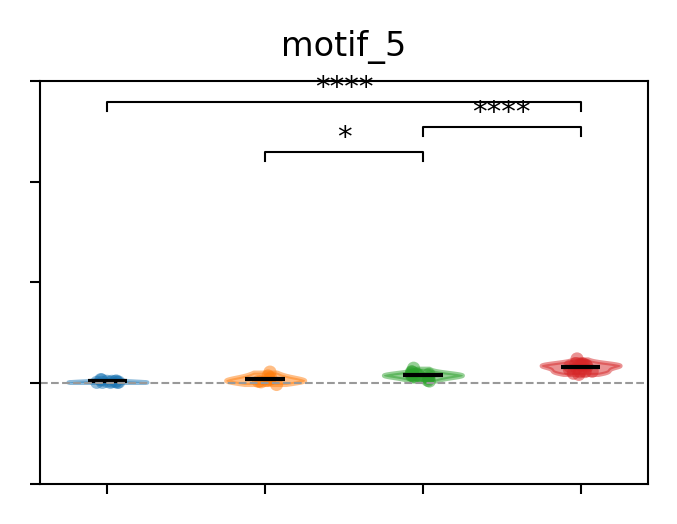

...

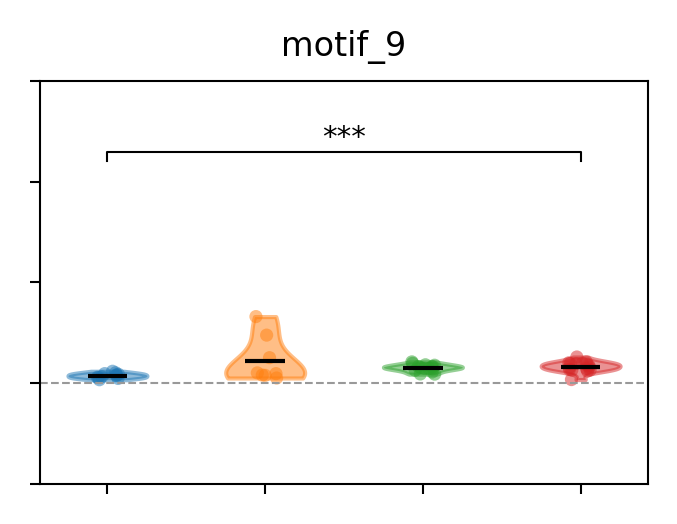

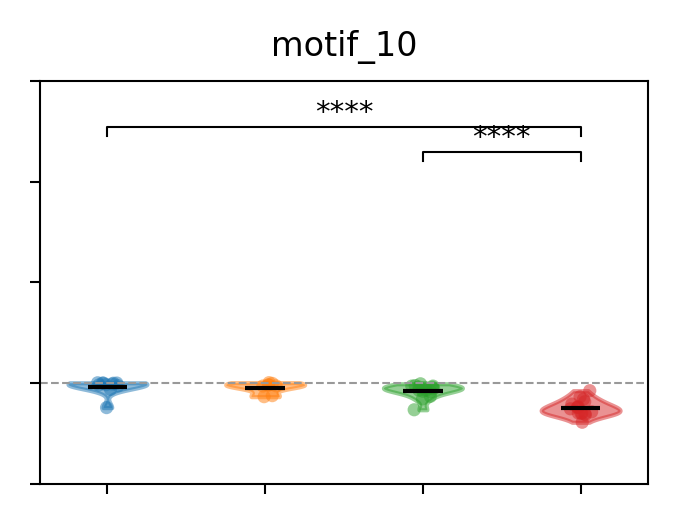

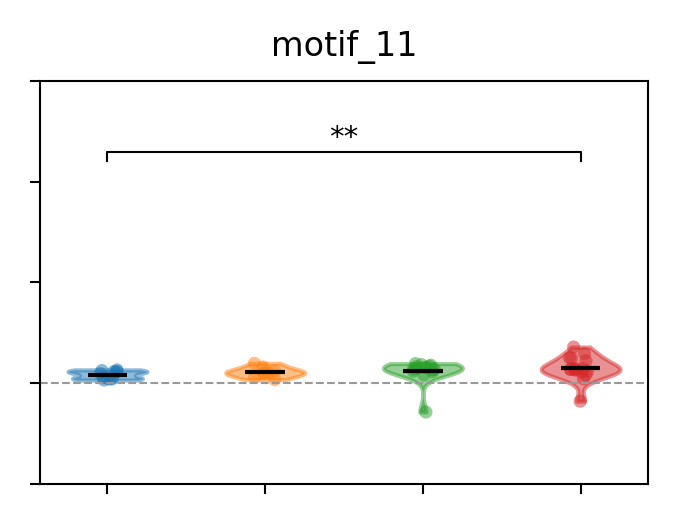

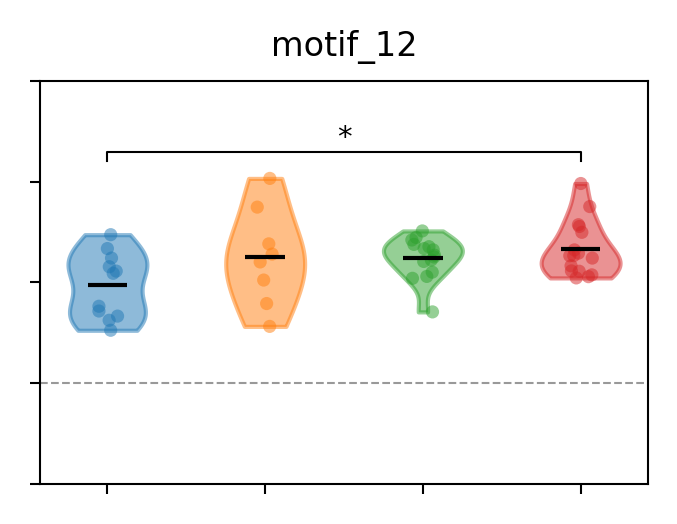

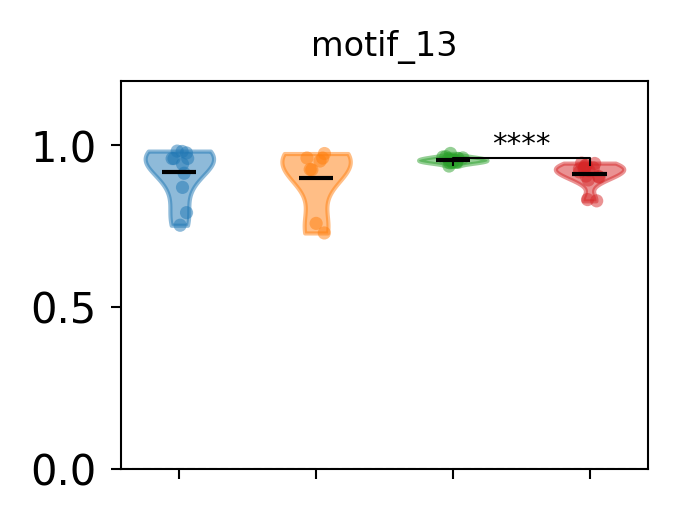

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu

# ===========================
# 你需要确保已有：
# NZ     : (n_region, 13)
# labels : (n_region,)  # 取值包含 1,2,3,4
# ===========================

# ===== 0) 画布尺寸：17cm 纸张一行放 3 个 =====
fig_w_cm = 5.3
fig_h_cm = 4.0
fig_w_in = fig_w_cm / 2.54
fig_h_in = fig_h_cm / 2.54

# ===== 1) 基本信息：cluster、颜色、需要检验的配对 =====
unique_clusters = np.array(sorted(np.unique(labels).tolist()))
n_clust = len(unique_clusters)
colors = plt.cm.tab10(np.arange(n_clust) % 10)

pairs = [(1, 2), (2, 3), (3, 4), (1, 4)]  # C1-C2, C2-C3, C3-C4, C1-C4

# ===== 2) 主循环：每个 motif 画一张图，并做 4 个两两非参数检验 =====
for j in range(13):
    vals = NZ[:, j]
    fig, ax = plt.subplots(figsize=(fig_w_in, fig_h_in))

    # ----- 2.1 按 cluster 准备 violin 数据 -----
    data_by_cluster = [vals[labels == c] for c in unique_clusters]

    parts = ax.violinplot(
        data_by_cluster,
        positions=np.arange(1, n_clust + 1),
        showmeans=True,
        showextrema=False,
        showmedians=False,
    )

    # violin 颜色
    for body, col in zip(parts["bodies"], colors):
        body.set_facecolor(col)
        body.set_edgecolor(col)
        body.set_alpha(0.5)

    # ----- 2.2 均值线改成黑线 -----
    if "cmeans" in parts and parts["cmeans"] is not None:
        parts["cmeans"].set_color("k")
        parts["cmeans"].set_linewidth(1.0)

    # ----- 2.3 叠点（每个 cluster 一个抖动散点） -----
    for i_pos, c in enumerate(unique_clusters, start=1):
        vc = vals[labels == c]
        if len(vc) == 0:
            continue
        jitter = (np.random.rand(len(vc)) - 0.5) * 0.15
        x_pos = np.full(len(vc), i_pos) + jitter
        ax.scatter(x_pos, vc, s=10, alpha=0.5, color=colors[i_pos - 1], edgecolors="none")

    # ----- 2.4 构造 “cluster值 -> x轴位置” 映射 -----
    pos_map = {int(c): i for i, c in enumerate(unique_clusters, start=1)}

    # ----- 2.5 纵坐标范围 + 稀疏刻度线 -----
    if j <= 11:
        # Motif 1-12：固定 [-0.2, 0.6]
        y_low, y_high = -0.2, 0.6
        base0, step, h = 0.44, 0.05, 0.018
        ax.set_yticks(np.arange(-0.2, 0.601, 0.2))
    else:
        # Motif 13：固定 [0, 1.2]，刻度到 1.0
        y_low, y_high = 0.0, 1.2
        base0, step, h = 0.94, 0.07, 0.02
        ax.set_yticks([0.0, 0.5, 1.0])

    # ----- 2.6 显著性括号（ns 不画，只画星号） -----
    n_drawn = 0
    for (a, b) in pairs:
        if (a not in pos_map) or (b not in pos_map):
            continue
        da = vals[labels == a]
        db = vals[labels == b]
        if (len(da) < 2) or (len(db) < 2):
            continue

        p = mannwhitneyu(da, db, alternative="two-sided").pvalue

        if p < 0.0001:
            star = "****"
        elif p < 0.001:
            star = "***"
        elif p < 0.01:
            star = "**"
        elif p < 0.05:
            star = "*"
        else:
            continue

        x1, x2 = pos_map[a], pos_map[b]
        if x1 > x2:
            x1, x2 = x2, x1

        y = base0 + n_drawn * step
        if y + h > y_high - 0.005:
            continue

        ax.plot([x1, x1, x2, x2], [y, y + h, y + h, y], lw=0.5, c="k")
        ax.text((x1 + x2) / 2, y + h, star, ha="center", va="bottom", fontsize=7)
        n_drawn += 1

    # ----- 2.7 y 轴范围固定 -----
    ax.set_ylim(y_low, y_high)

    # ----- 2.8 0 参考线：灰色虚线（0.5pt） -----
    ax.axhline(0, color="0.6", lw=0.5, ls="--")

    # ----- 2.9 标题：motif_{id}（其余坐标名称不要） -----
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title(f"motif_{j+1}", fontsize=8)

    # x 轴只留刻度线，不留数值
    ax.set_xticks(np.arange(1, n_clust + 1))
    ax.tick_params(axis="x", which="both", labelbottom=False)

    # y 轴：只在 motif1 和 motif12 保留刻度数值（其余隐藏数值但保留刻度线）
    if (j == 0) or (j == 12):
        ax.tick_params(axis="y", which="both", labelleft=True)
    else:
        ax.tick_params(axis="y", which="both", labelleft=False)

    # ----- 2.10 坐标轴 & 刻度线改成 0.5pt -----
    for sp in ax.spines.values():
        sp.set_linewidth(0.5)
    ax.tick_params(axis="both", which="both", width=0.5, length=2.5)

    # ----- 2.11 保存透明底 SVG（每个 motif 一张） -----
    out_svg = f"motif_{j+1:02d}_violin.svg"
    plt.tight_layout(pad=0.1)
    plt.savefig(out_svg, transparent=True, bbox_inches="tight")
    plt.show()

Saved figure: 6.MOp_motif_frequency_vs_param.svg


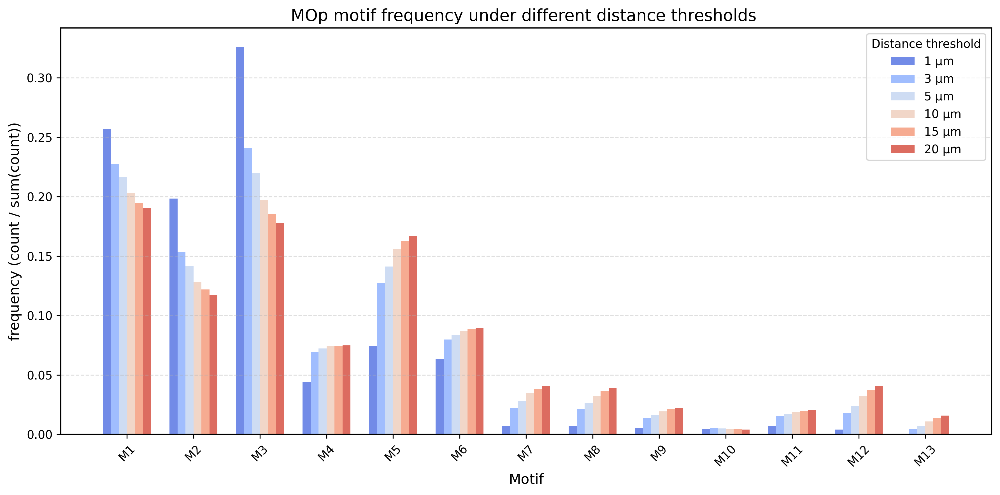

Saved figure: 6.MOp_motif_NZ_ER_vs_param.svg


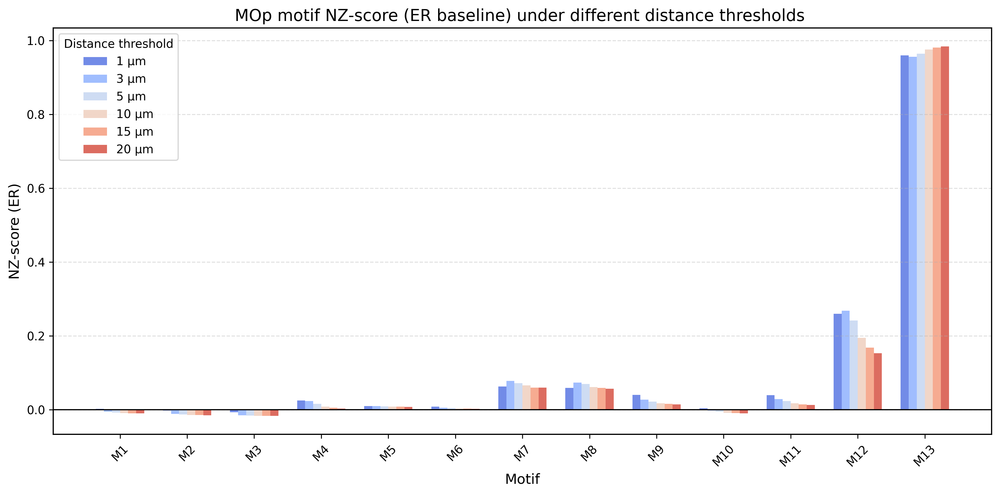

In [23]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ========= 0. 读数据 =========
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    d_all = pickle.load(f)

results = d_all["results"]   # dict: param -> {region -> info}


# ========= 1. 收集某个脑区在不同 param 下的 motif frequency & NZ =========

def collect_region_motif_across_params(region, params, thr_to_use="0"):
    """
    对指定 region，在多个距离阈值 param 下，收集：
      - freq: real_motif / sum(real_motif)
      - nz  : NZ_ER（优先用 NZ_raw，没有就用 NZ）
    返回:
      freq_dict[param] = 13 维数组
      nz_dict[param]   = 13 维数组
    """
    freq_dict = {}
    nz_dict   = {}

    for p in params:
        res_p = results.get(p, {})
        info = res_p.get(region, None)
        if info is None:
            print(f"[WARN] param={p} 下没有 region={region}")
            continue

        mr = info["motif_results"].get(thr_to_use, None)
        if mr is None:
            print(f"[WARN] param={p}, region={region} 下没有 thr={thr_to_use}")
            continue

        # ----- real_motif → 频率 -----
        real = np.asarray(mr["real_motif"], dtype=float)
        if real.shape[0] == 14:
            real = real[1:]
        if real.shape[0] != 13:
            print(f"[WARN] param={p}, region={region}: real_motif 维度异常: {real.shape}")
            continue

        total = real.sum()
        if total <= 0:
            print(f"[WARN] param={p}, region={region}: motif 总数为 0")
            continue

        freq = real / total

        # ----- NZ_ER：优先 NZ_raw，没有就用 NZ -----
        # if "NZ_raw" in mr:
        #     nz = np.asarray(mr["NZ_raw"], dtype=float)
        # else:
        nz = np.asarray(mr["NZ"], dtype=float)

        if nz.shape[0] == 14:
            nz = nz[1:]
        if nz.shape[0] != 13:
            print(f"[WARN] param={p}, region={region}: NZ 维度异常: {nz.shape}")
            continue

        freq_dict[p] = freq
        nz_dict[p]   = nz

    return freq_dict, nz_dict


# ========= 2. 画图：motif frequency / sum(motif) =========

def plot_region_freq_by_param(region, freq_dict, title_suffix=""):
    """
    freq_dict[param] = 13 维 freq
    多个 param 用多种颜色，在同一张图里画 grouped bar。
    """
    params = sorted(freq_dict.keys())  # 比如 [1,3,5,10,15,20]
    if not params:
        print(f"[ERROR] region={region} 的 freq_dict 为空，检查一下数据/阈值")
        return

    n_motif = len(next(iter(freq_dict.values())))
    x = np.arange(n_motif)
    order = list(range(1, n_motif + 1))

    bar_width = 0.12
    colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params)))

    plt.figure(figsize=(12, 6))

    for j, p in enumerate(params):
        freq = freq_dict[p]

        plt.bar(
            x + j * bar_width,
            freq,
            width=bar_width,
            label=f"{p} µm",
            color=colors[j],
            alpha=0.85
        )

    plt.title(f'{region} motif frequency under different distance thresholds {title_suffix}',
              fontsize=14)
    plt.xlabel('Motif', fontsize=12)
    plt.ylabel('frequency (count / sum(count))', fontsize=12)
    plt.xticks(
        x + bar_width * (len(params) - 1) / 2,
        [f"M{i}" for i in order],
        rotation=45
    )
    plt.legend(title='Distance threshold')
    plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout()
    fname = f'6.{region}_motif_frequency_vs_param.svg'
    plt.savefig(fname, format='svg', bbox_inches='tight')
    print("Saved figure:", fname)
    plt.show()


# ========= 3. 画图：NZ_ER（z-score, ER 基准） =========

def plot_region_NZ_by_param(region, nz_dict, title_suffix=""):
    """
    nz_dict[param] = 13 维 NZ_ER
    和 frequency 一样，用 grouped bar。
    """
    params = sorted(nz_dict.keys())
    if not params:
        print(f"[ERROR] region={region} 的 nz_dict 为空，检查一下数据/阈值")
        return

    n_motif = len(next(iter(nz_dict.values())))
    x = np.arange(n_motif)
    order = list(range(1, n_motif + 1))

    bar_width = 0.12
    colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params)))

    plt.figure(figsize=(12, 6))

    for j, p in enumerate(params):
        nz = nz_dict[p]

        plt.bar(
            x + j * bar_width,
            nz,
            width=bar_width,
            label=f"{p} µm",
            color=colors[j],
            alpha=0.85
        )

    plt.title(f'{region} motif NZ-score (ER baseline) under different distance thresholds {title_suffix}',
              fontsize=14)
    plt.xlabel('Motif', fontsize=12)
    plt.ylabel('NZ-score (ER)', fontsize=12)
    plt.xticks(
        x + bar_width * (len(params) - 1) / 2,
        [f"M{i}" for i in order],
        rotation=45
    )
    plt.axhline(0, color='k', lw=1)
    plt.legend(title='Distance threshold')
    plt.grid(axis='y', linestyle='--', alpha=0.4)

    plt.tight_layout()
    fname = f'6.{region}_motif_NZ_ER_vs_param.svg'
    plt.savefig(fname, format='svg', bbox_inches='tight')
    print("Saved figure:", fname)
    plt.show()


# ========= 4. 调用：以 MOp 为例 =========

region = "MOp"
param_list = [1, 3, 5, 10, 15, 20]
thr_to_use = "0"   # 你现在用的强度阈值

freq_dict, nz_dict = collect_region_motif_across_params(region, param_list, thr_to_use=thr_to_use)

plot_region_freq_by_param(region, freq_dict)
plot_region_NZ_by_param(region, nz_dict)

In [37]:
# ===== 从 data 中按 names 顺序取出 ES，None 标记成 NaN =====
ES = np.full((len(names), 13), np.nan)

for i, r in enumerate(names):
    info = data[r]
    mr = info["motif_results"].get("0")   # 和前面一样的 thr_to_use
    es = mr.get("ES_raw", None)

    if es is None:
        continue  # 这一行保持 NaN，全 motif 都跳过
    es = np.asarray(es, float)
    if es.shape[0] != 13:
        continue

    ES[i, :] = es

In [1]:
param_to_use = 5
thr_to_use   = "0.1"

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    d = pickle.load(f)

res_param = d["results"][param_to_use]

# 之前已经算好的：
# NZ, names, labels, spars, ...

# ===== 1. 基于原始 sc 计算每个脑区的平均出度 / 入度 =====
thr_val = float(thr_to_use)

deg_out = np.zeros(len(names))
deg_in  = np.zeros(len(names))

for i, r in enumerate(names):
    info = res_param[r]
    sc = np.asarray(info["sc"], float)   # 原始强度矩阵
    A = (sc > 0).astype(float)     # 按强度阈值二值化
    np.fill_diagonal(A, 0.0)             # 不算自连接

    deg_out_nodes = A.sum(axis=1)        # 每个节点的出度
    deg_in_nodes  = A.sum(axis=0)        # 每个节点的入度

    # 每个脑区一个平均出度 / 入度（也可以换成中位数）
    deg_out[i] = deg_out_nodes.mean()
    deg_in[i]  = deg_in_nodes.mean()

NameError: name 'pickle' is not defined

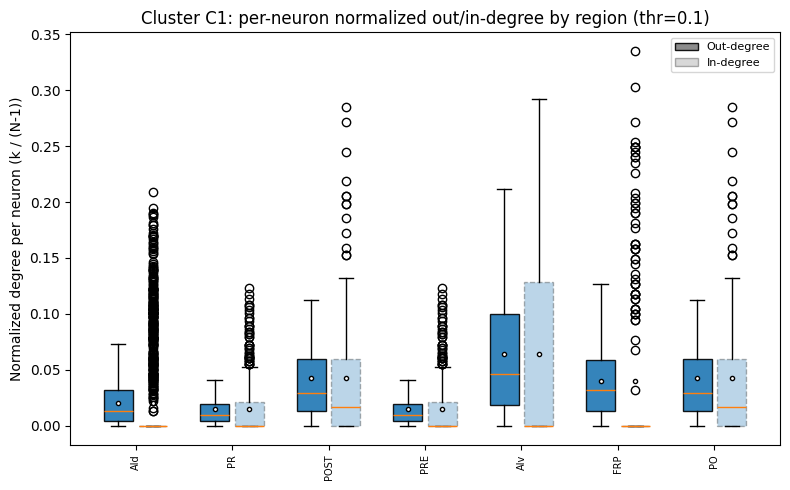

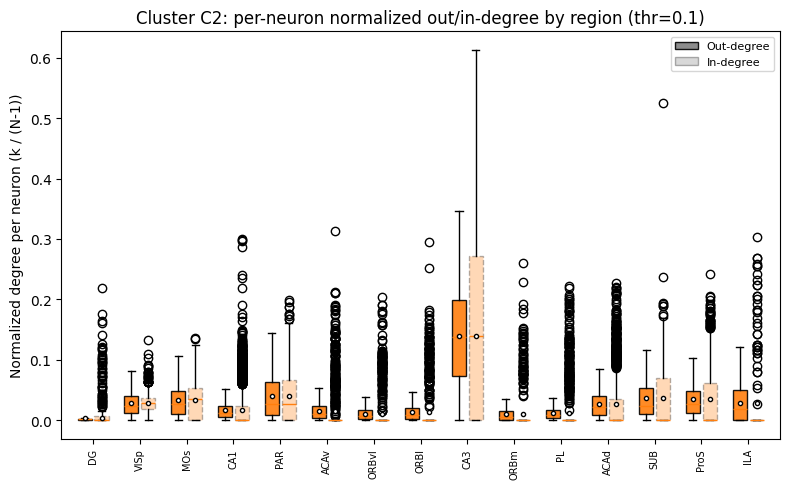

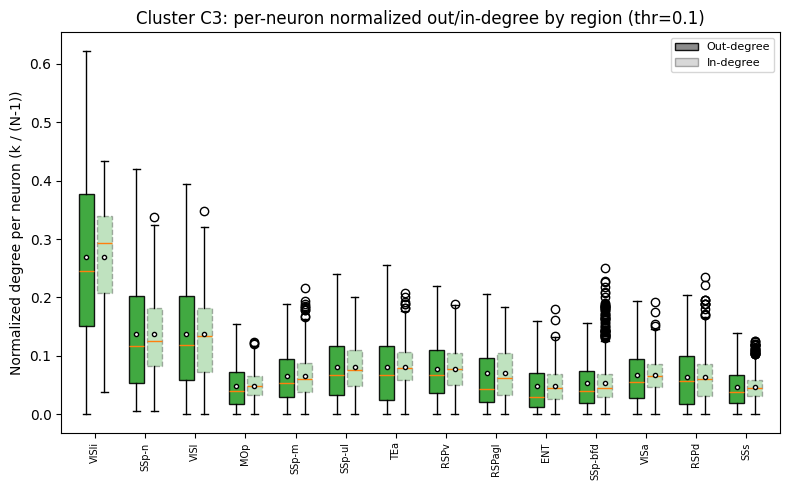

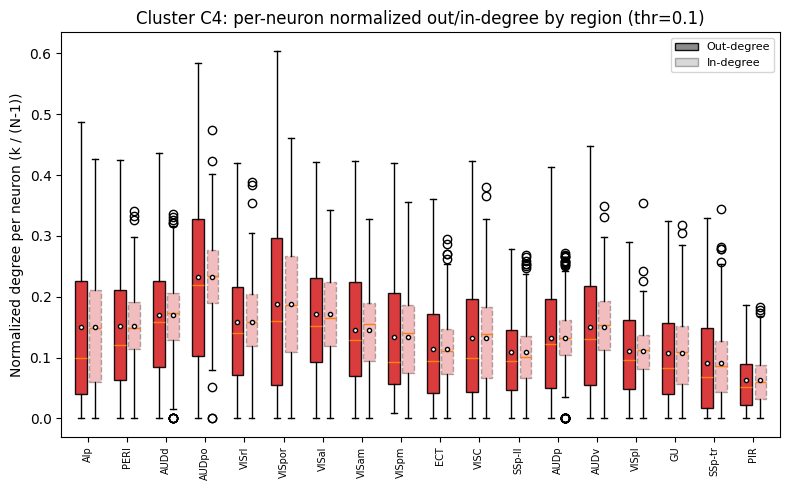

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

# ==================== 1. 基于 sc 计算归一化出入度分布 ====================
thr_val = float(thr_to_use)

out_deg_norm_list = []   # 每个元素：该脑区所有神经元的归一化出度 k_out/(N-1)
in_deg_norm_list  = []   # 每个元素：该脑区所有神经元的归一化入度 k_in/(N-1)

for r in names:
    info = res_param[r]
    sc = np.asarray(info["sc"], float)   # 原始强度矩阵 (N_i, N_i)

    # 按强度阈值二值化
    A = (sc > 0.0).astype(float)
    np.fill_diagonal(A, 0.0)

    N = A.shape[0]
    if N <= 1:
        out_deg_norm_list.append(np.array([]))
        in_deg_norm_list.append(np.array([]))
        continue

    deg_out_nodes = A.sum(axis=1)        # 每个神经元出度
    deg_in_nodes  = A.sum(axis=0)        # 每个神经元入度

    # 归一化：除以 (N-1)，消除采样规模 N 的影响
    out_deg_norm = deg_out_nodes / (N - 1)
    in_deg_norm  = deg_in_nodes  / (N - 1)

    out_deg_norm_list.append(out_deg_norm)
    in_deg_norm_list.append(in_deg_norm)

# ==================== 2. 四类 cluster，各画一张箱线图（无 outlier） ====================
unique_clusters = np.unique(labels)
colors_cluster = plt.cm.tab10((unique_clusters - 1) % 10)  # 每个 cluster 一个颜色

for c, col_c in zip(unique_clusters, colors_cluster):
    # 找到属于该 cluster 的脑区索引
    idx = np.where(labels == c)[0]
    if len(idx) == 0:
        continue

    region_names_c = names[idx]
    out_c = [out_deg_norm_list[i] for i in idx]
    in_c  = [in_deg_norm_list[i]  for i in idx]

    # 过滤掉可能为空的脑区（例如 N<=1）
    valid = [i for i, (o, inn) in enumerate(zip(out_c, in_c)) if len(o) > 0 and len(inn) > 0]
    if not valid:
        continue

    region_names_c = region_names_c[valid]
    out_c = [out_c[i] for i in valid]
    in_c  = [in_c[i]  for i in valid]

    n_regions_c = len(region_names_c)
    x = np.arange(n_regions_c)

    fig, ax = plt.subplots(figsize=(max(8, n_regions_c * 0.4), 5))

    # 出度箱线图（在 x-0.18），不显示 outlier
    bp_out = ax.boxplot(
        out_c,
        positions=x - 0.18,
        widths=0.3,
        patch_artist=True,
        showmeans=True,
        showfliers=False,
    )

    # 入度箱线图（在 x+0.18），不显示 outlier
    bp_in = ax.boxplot(
        in_c,
        positions=x + 0.18,
        widths=0.3,
        patch_artist=True,
        showmeans=True,
        showfliers=True,
    )

    # 出度：该 cluster 的颜色，实心
    for box in bp_out["boxes"]:
        box.set(facecolor=col_c, edgecolor="k", alpha=0.9)
    # 入度：同色，但淡一点 + 虚线边框
    for box in bp_in["boxes"]:
        box.set(facecolor=col_c, edgecolor="k", alpha=0.3, linestyle="--")

    # 均值点强调一下
    for m in bp_out["means"]:
        m.set(marker="o", markersize=3, markerfacecolor="white", markeredgecolor="k")
    for m in bp_in["means"]:
        m.set(marker="o", markersize=3, markerfacecolor="white", markeredgecolor="k")

    ax.set_xticks(x)
    ax.set_xticklabels(region_names_c, rotation=90, fontsize=7)

    ax.set_ylabel("Normalized degree per neuron (k / (N-1))")
    ax.set_title(f"Cluster C{int(c)}: per-neuron normalized out/in-degree by region (thr={thr_to_use})")

    legend_patches = [
        Patch(facecolor="gray", edgecolor="k", alpha=0.9, label="Out-degree"),
        Patch(facecolor="gray", edgecolor="k", alpha=0.3, label="In-degree"),
    ]
    ax.legend(handles=legend_patches, loc="upper right", fontsize=8)

    plt.tight_layout()
    plt.show()

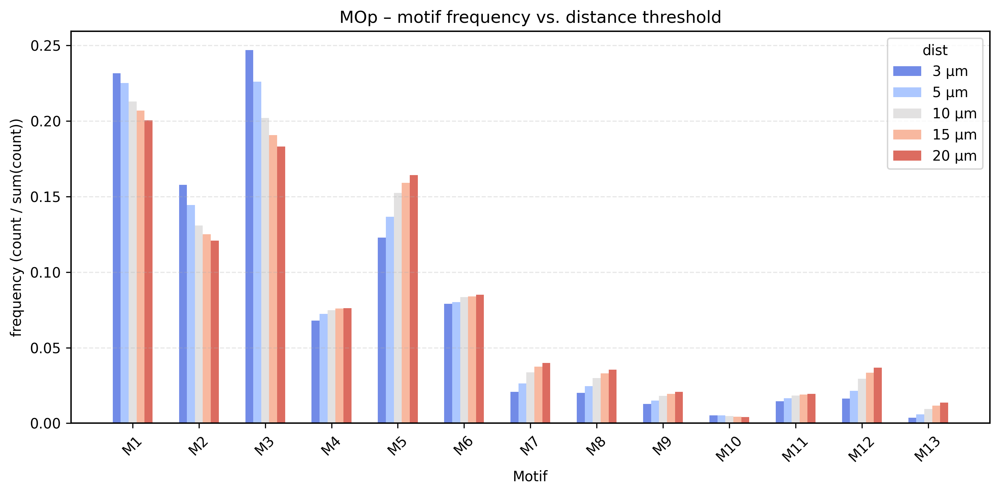

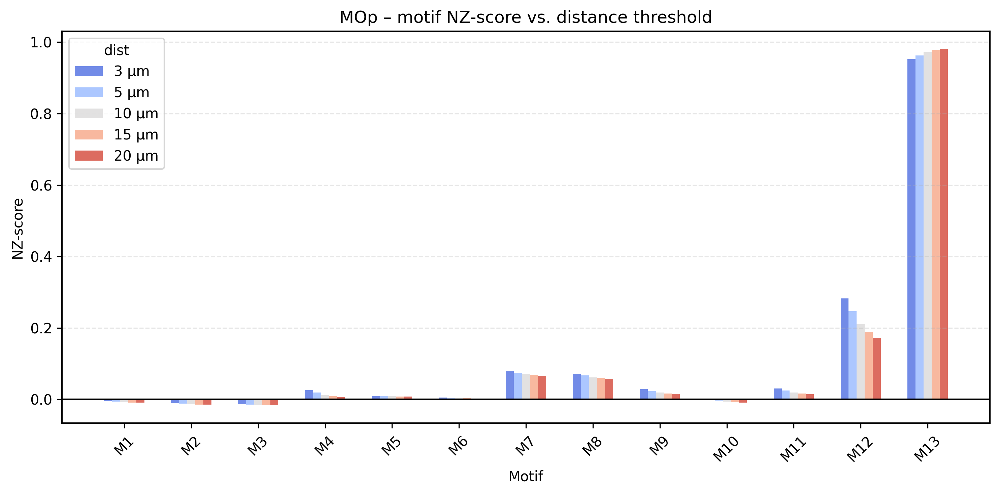

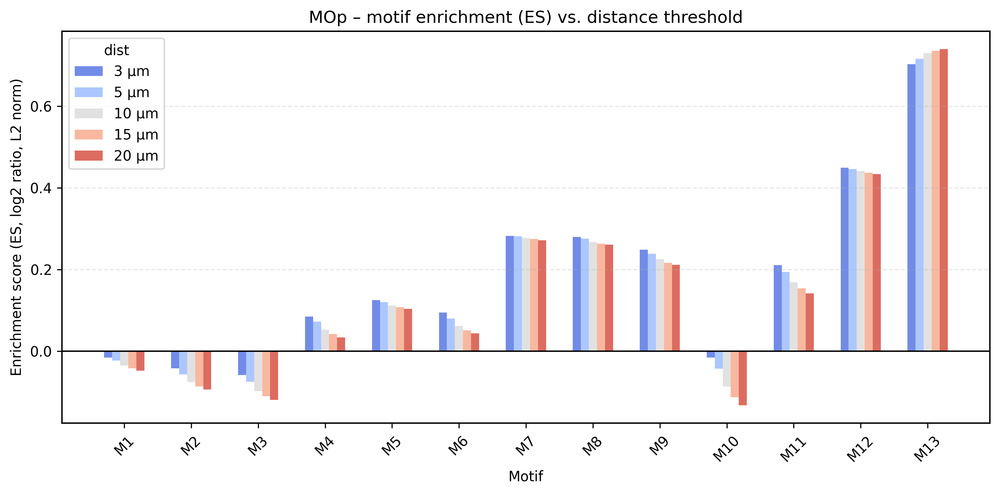

In [24]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 基本参数 =====
pkl_path   = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
region     = "MOp"                 # 换成你想看的脑区
param_list = [ 3, 5, 10, 15, 20] # 不同距离阈值
thr        = "0.1"                   # motif_results 的 key

# ===== 1. 读数据 =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]   # dict[param][region]["motif_results"][thr]

freq_dict = {}
nz_dict   = {}
es_dict   = {}

for p in param_list:
    mr = results[p][region]["motif_results"][thr]

    # ---- 频率：real_motif / sum ----
    real = np.asarray(mr["real_motif"], float)
    freq_dict[p] = real / real.sum()

    # ---- NZ ----
    nz = np.asarray(mr["NZ"], float)
    nz_dict[p] = nz

    # ---- ES：用你指定的公式重算 ----
    # es_raw = log2(real) - log2(mu_eq), 然后 L2 归一化
    mu_eq  = np.asarray(mr["er_mu_eq"], float)
    es_raw = np.log2(real) - np.log2(mu_eq)
    es_norm = es_raw / np.linalg.norm(es_raw)
    es_dict[p] = es_norm

# 公共横坐标
x  = np.arange(13)
bw = 0.12

# ===== 2. 画 freq（motif frequency / sum）=====
params_freq = sorted(freq_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_freq):
    plt.bar(x + i*bw, freq_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_freq)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.ylabel("frequency (count / sum(count))")
plt.xlabel("Motif")
plt.title(f"{region} – motif frequency vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_frequency_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 3. 画 NZ =====
params_nz = sorted(nz_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_nz):
    plt.bar(x + i*bw, nz_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_nz)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("NZ-score")
plt.xlabel("Motif")
plt.title(f"{region} – motif NZ-score vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_NZ_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 4. 画 ES（用新公式计算的 ES_norm）=====
params_es = sorted(es_dict.keys())
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(params_freq)))

plt.figure(figsize=(10, 5))
for i, p in enumerate(params_es):
    plt.bar(x + i*bw, es_dict[p], width=bw,
            alpha=0.85, color=colors[i], label=f"{p} µm")
plt.xticks(x + bw*(len(params_es)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("Enrichment score (ES, log2 ratio, L2 norm)")
plt.xlabel("Motif")
plt.title(f"{region} – motif enrichment (ES) vs. distance threshold")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="dist")
plt.tight_layout()
plt.savefig(f"6.{region}_motif_ES_vs_param.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

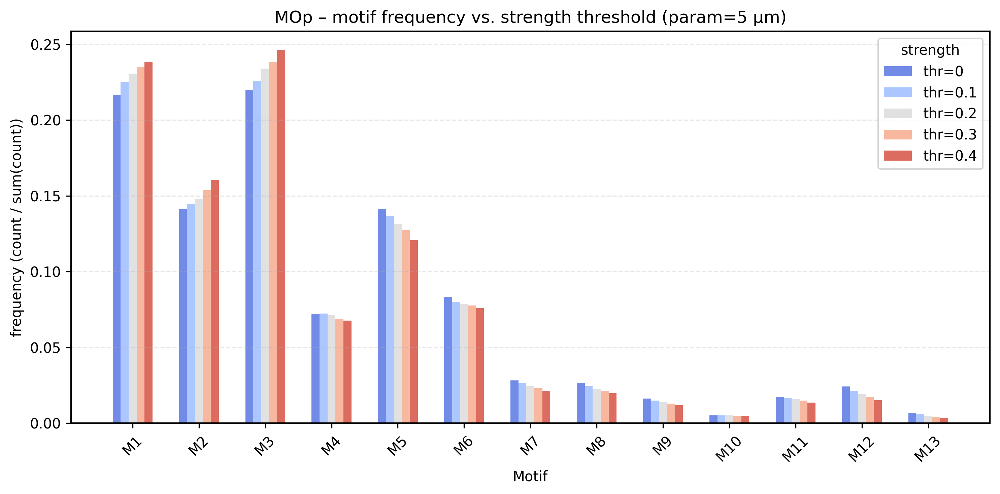

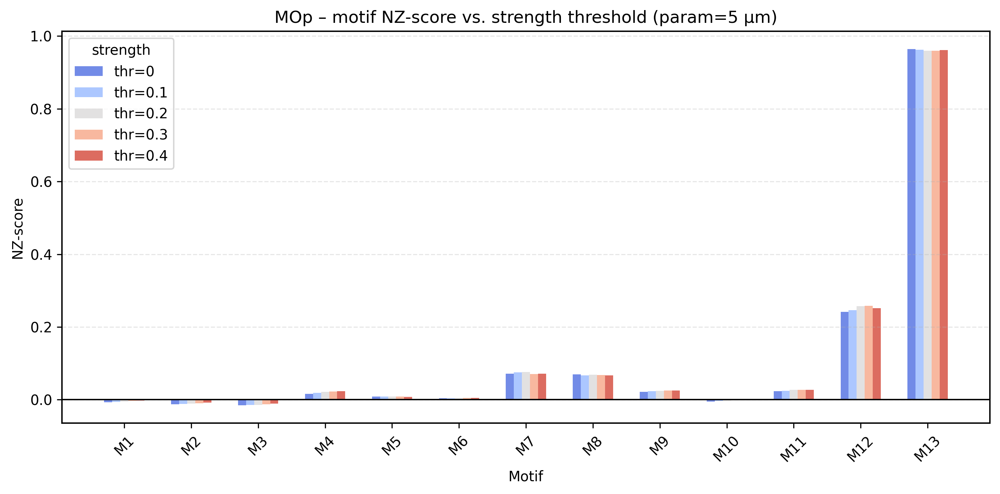

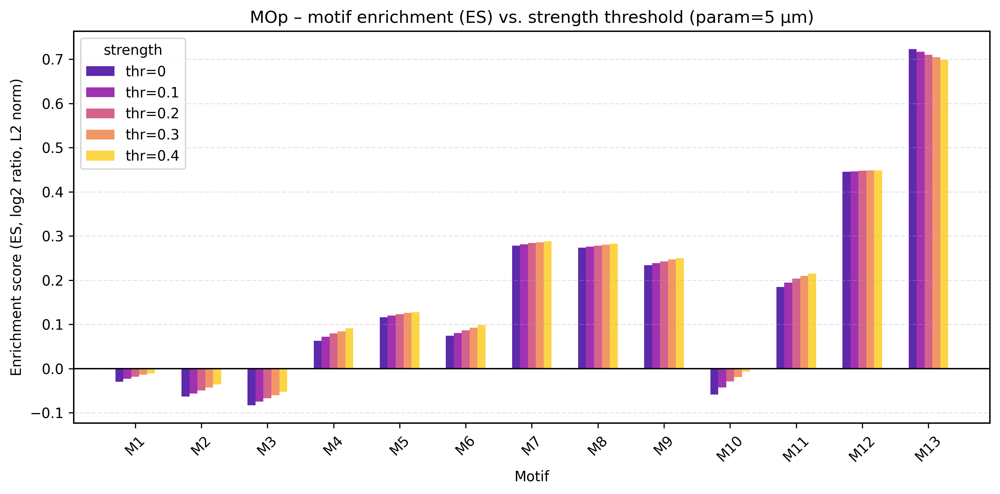

In [25]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 基本参数 =====
pkl_path   = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
region     = "MOp"                 # 换成你想看的脑区
param      = 5                     # 固定距离阈值 5 µm
thr_list   = ["0", "0.1", "0.2", "0.3", "0.4"]   # 五个不同连接强度阈值

# ===== 1. 读数据 =====
with open(pkl_path, "rb") as f:
    results = pickle.load(f)["results"]   # dict[param][region]["motif_results"][thr]

freq_dict = {}
nz_dict   = {}
es_dict   = {}

for thr in thr_list:
    mr = results[param][region]["motif_results"][thr]

    # ---- 频率：real_motif / sum ----
    real = np.asarray(mr["real_motif"], float)
    freq_dict[thr] = real / real.sum()

    # ---- NZ ----
    nz = np.asarray(mr["NZ"], float)
    nz_dict[thr] = nz

    # ---- ES：用你指定的公式重算 ----
    mu_eq  = np.asarray(mr["er_mu_eq"], float)
    es_raw = np.log2(real) - np.log2(mu_eq)
    es_norm = es_raw / np.linalg.norm(es_raw)
    es_dict[thr] = es_norm

# 公共横坐标
x  = np.arange(13)
bw = 0.12

# ===== 2. 画 freq（motif frequency / sum）=====
thr_freq = [t for t in thr_list if t in freq_dict]
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(thr_freq)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_freq):
    plt.bar(x + i*bw, freq_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_freq)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.ylabel("frequency (count / sum(count))")
plt.xlabel("Motif")
plt.title(f"{region} – motif frequency vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_frequency_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 3. 画 NZ =====
thr_nz = [t for t in thr_list if t in nz_dict]
colors = plt.cm.coolwarm(np.linspace(0.1, 0.9, len(thr_nz)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_nz):
    plt.bar(x + i*bw, nz_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_nz)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("NZ-score")
plt.xlabel("Motif")
plt.title(f"{region} – motif NZ-score vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_NZ_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

# ===== 4. 画 ES（用新公式计算的 ES_norm）=====
thr_es = [t for t in thr_list if t in es_dict]
colors = plt.cm.plasma(np.linspace(0.1, 0.9, len(thr_es)))

plt.figure(figsize=(10, 5))
for i, thr in enumerate(thr_es):
    plt.bar(x + i*bw, es_dict[thr], width=bw,
            alpha=0.85, color=colors[i], label=f"thr={thr}")
plt.xticks(x + bw*(len(thr_es)-1)/2,
           [f"M{i}" for i in range(1, 14)], rotation=45)
plt.axhline(0, color="k", lw=1)
plt.ylabel("Enrichment score (ES, log2 ratio, L2 norm)")
plt.xlabel("Motif")
plt.title(f"{region} – motif enrichment (ES) vs. strength threshold (param={param} µm)")
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend(title="strength")
plt.tight_layout()
plt.savefig(f"8.{region}_motif_ES_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

In [12]:
real = results[1][region]["motif_results"]["0"]["real_motif"]
mu = results[1][region]["motif_results"]["0"]["er_mu_eq"]
print(np.log2(real)-np.log2(mu))

[ 0.13961044 -0.23537321 -0.52035632  3.19126185  3.94026091  3.7078191
  8.16305991  8.10962066  7.77813373  1.59771594  7.09759357 12.94395744
 19.44077687]


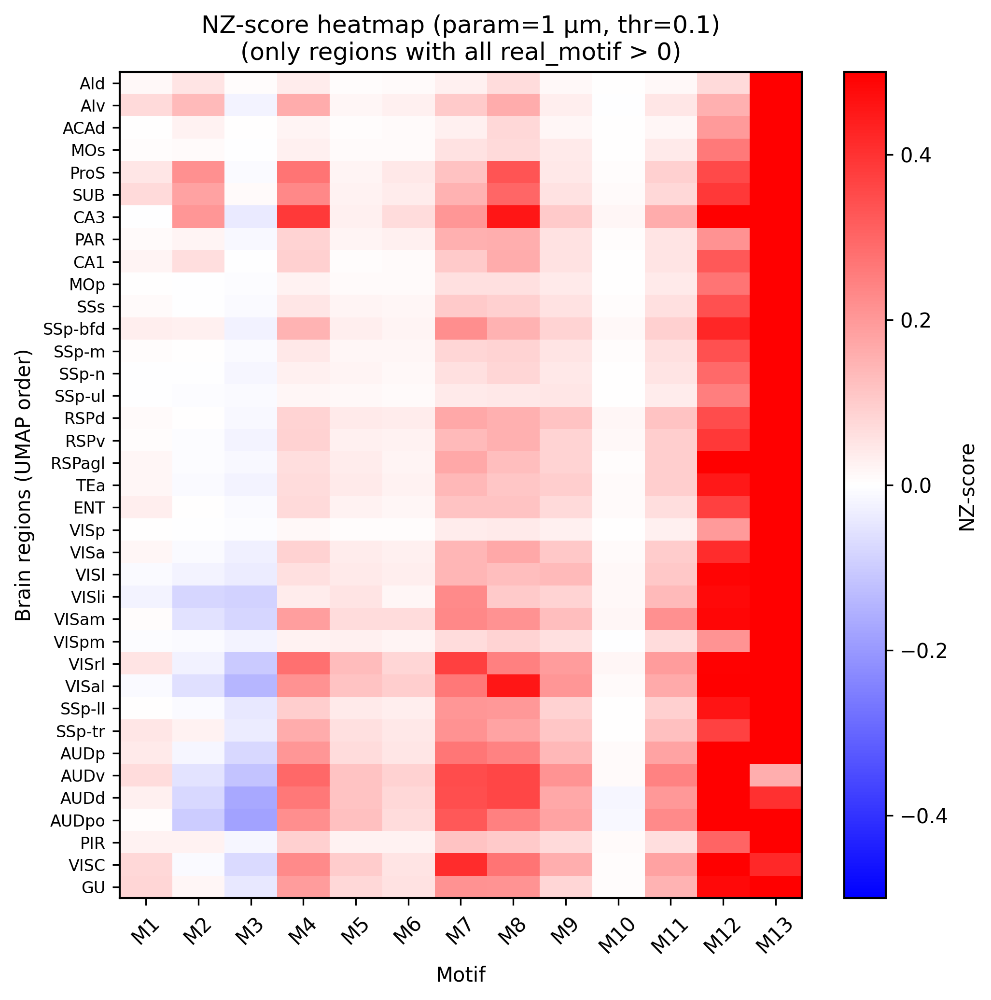

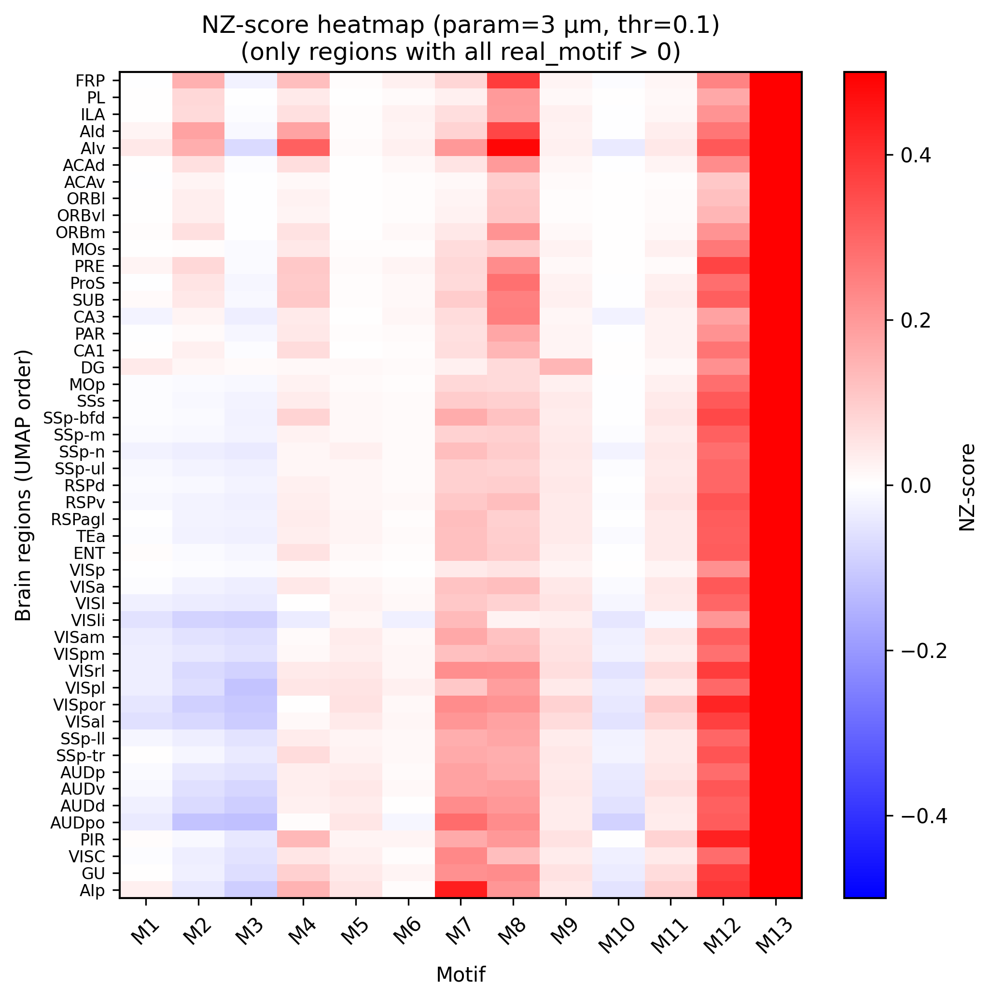

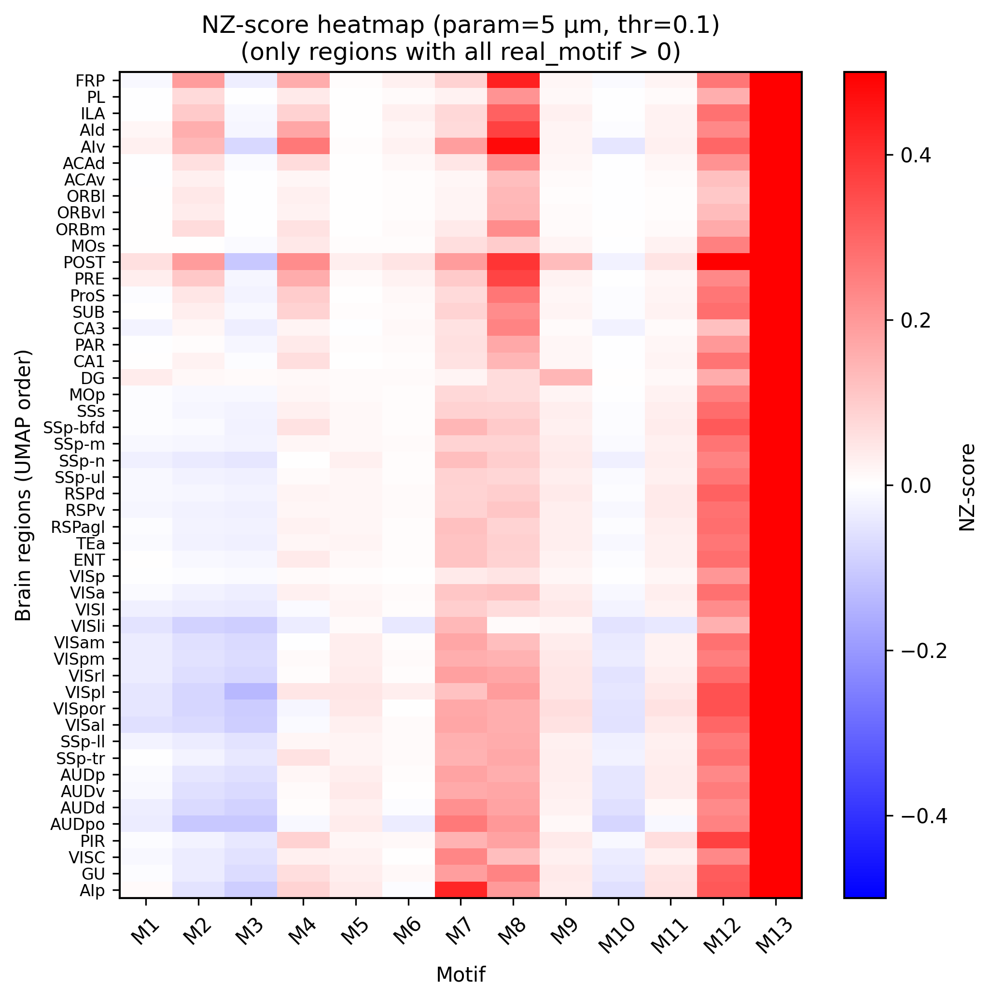

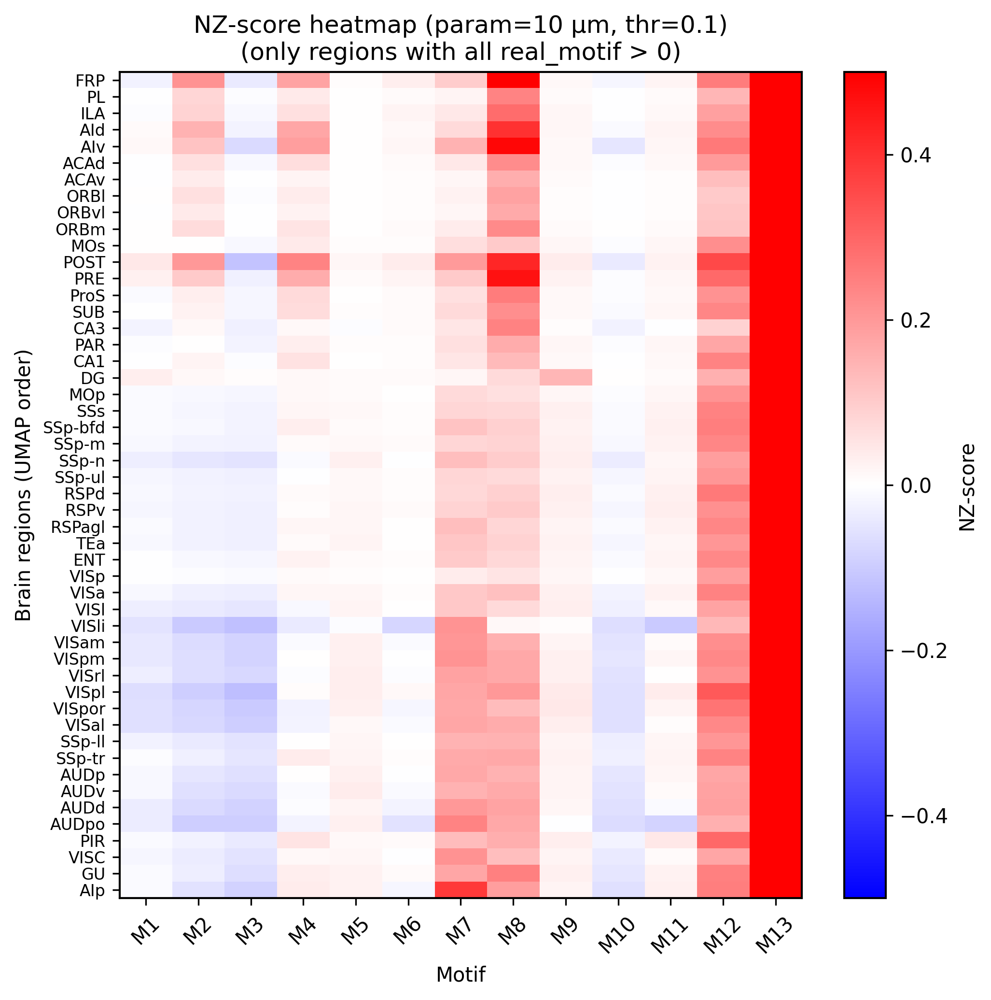

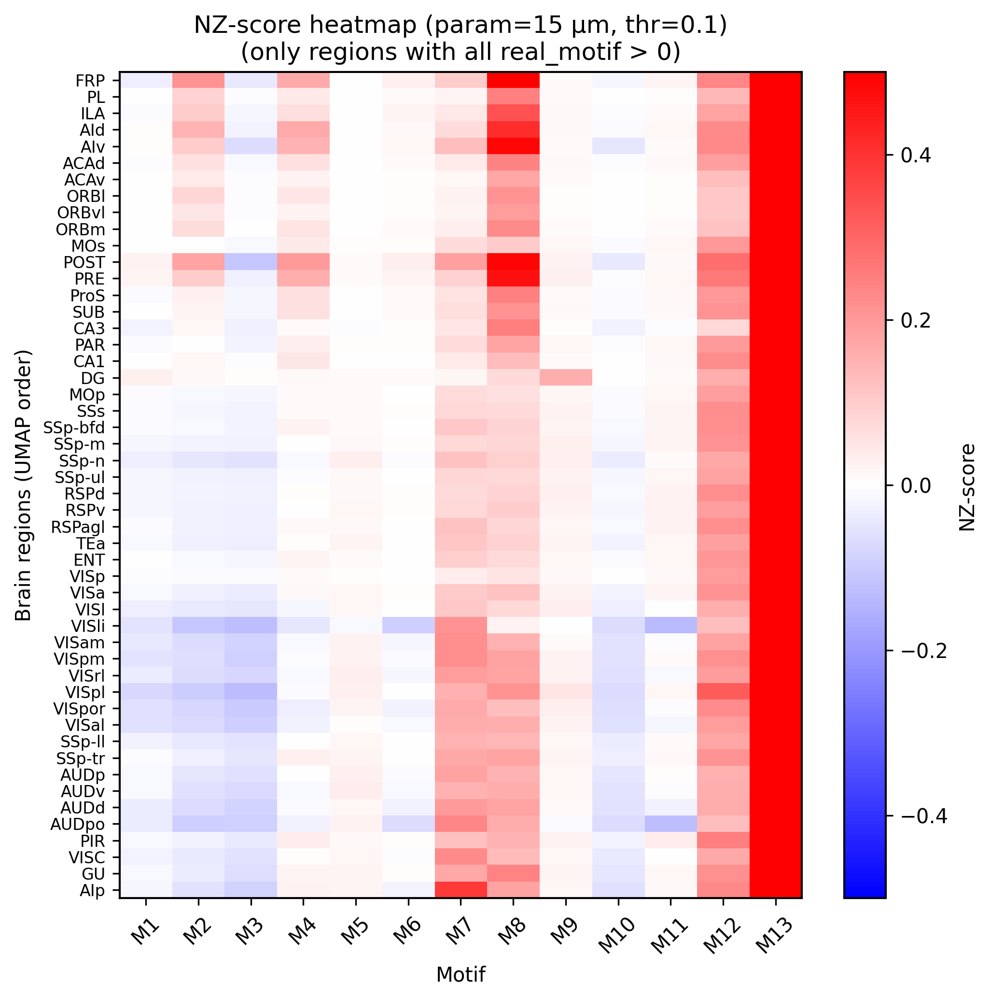

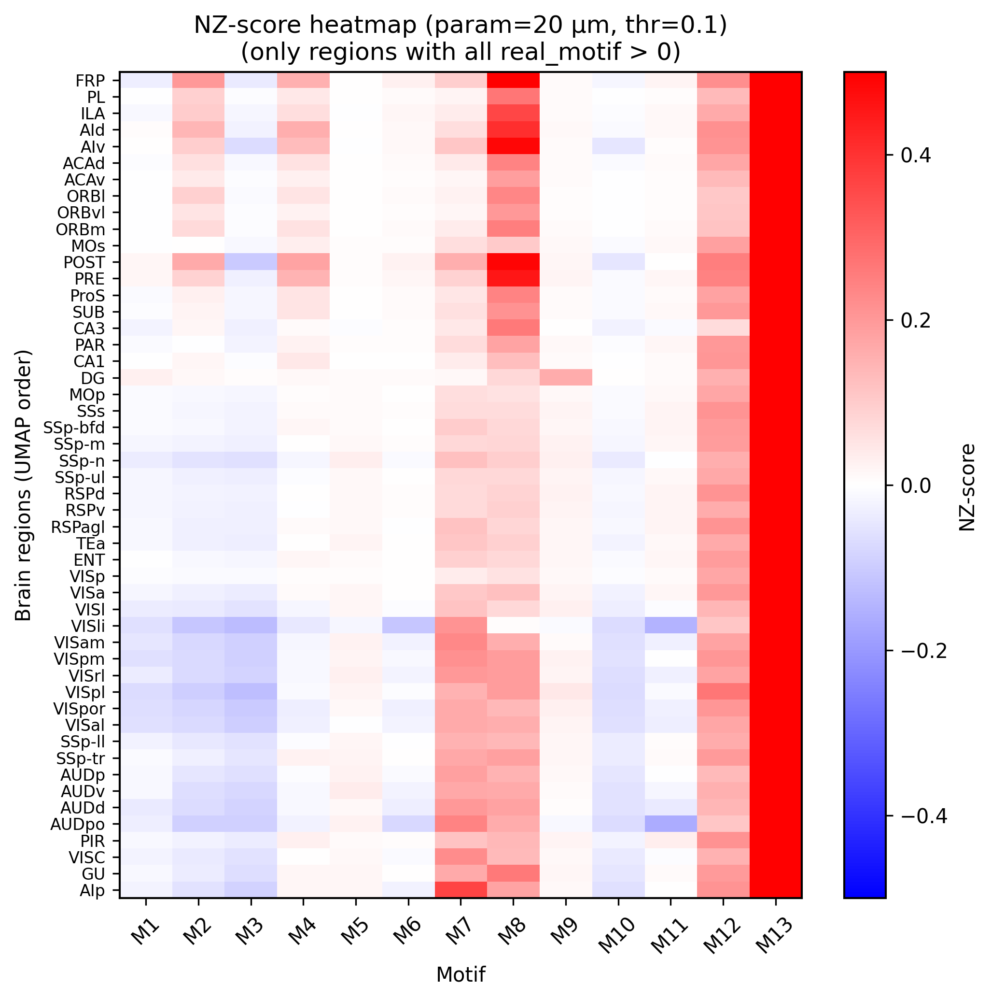

In [5]:
# ==================== 4. 每个距离阈值单独画 NZ-score 热图（按 UMAP 顺序 + 过滤 real>0） ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_list = [1, 3, 5, 10, 15, 20]
thr_use    = "0.1"   # 和上面聚类用的一致

for p in param_list:
    NZ_rows = []
    region_rows = []

    for r in names:   # names 是你前面按 UMAP+层次聚类排好序的脑区列表
        info = results_all[p][r]
        mr   = info["motif_results"][thr_use]

        real = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        # 如果这个脑区在该阈值下有任何 motif 计数 <= 0，就跳过整行
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.):
            # print(f"[INFO] param={p} µm, region={r} 因 real_motif 包含非正值，跳过")
            continue
        
        
        nz = np.asarray(mr["NZ"], float)   # 13 维 NZ-score
        NZ_rows.append(nz)
        region_rows.append(r)

    if not NZ_rows:
        print(f"[INFO] param={p} µm 下没有满足 real_motif>0 的脑区，跳过绘图")
        continue

    NZ_mat = np.vstack(NZ_rows)

    plt.figure(figsize=(7, 7))
    im = plt.imshow(NZ_mat, aspect="auto", cmap="bwr", vmin=-0.5, vmax=0.5)

    plt.colorbar(im, label="NZ-score")
    plt.yticks(range(len(region_rows)), region_rows, fontsize=8)
    plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)

    plt.title(f"NZ-score heatmap (param={p} µm, thr={thr_use})\n"
              f"(only regions with all real_motif > 0)")
    plt.xlabel("Motif")
    plt.ylabel("Brain regions (UMAP order)")

    plt.tight_layout()
    plt.savefig(f"7.wb_motif_NZ_param_{p}um.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

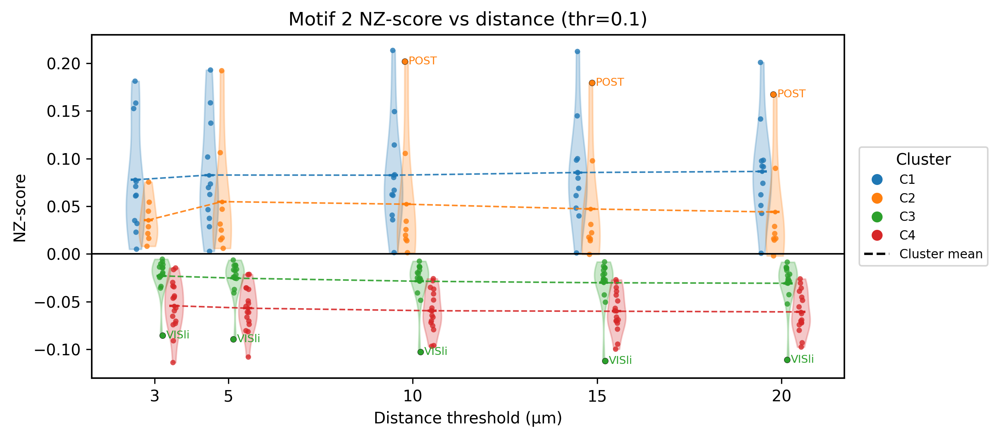

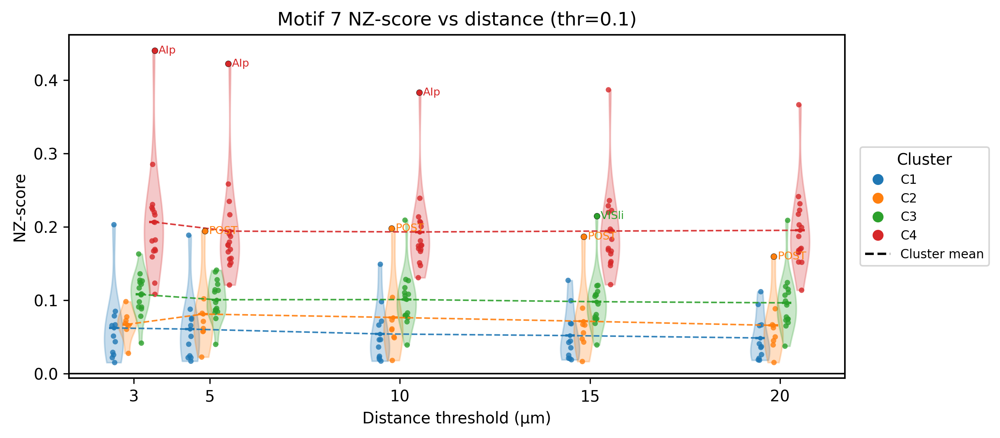

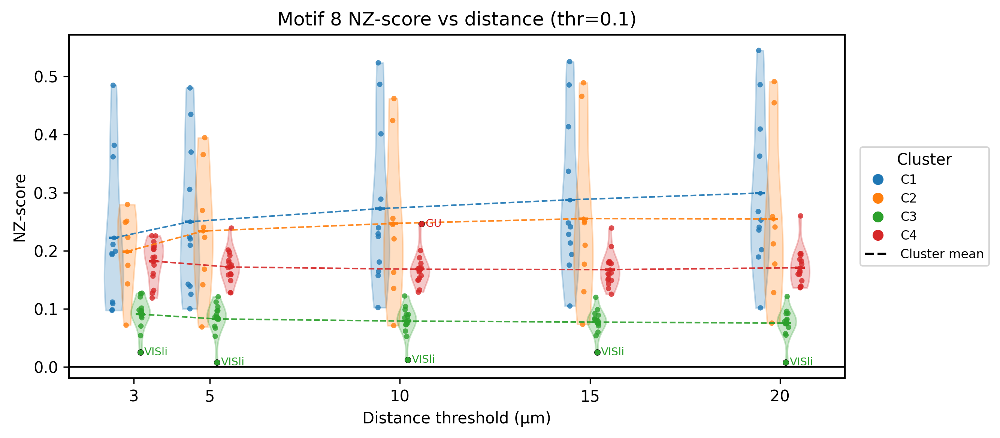

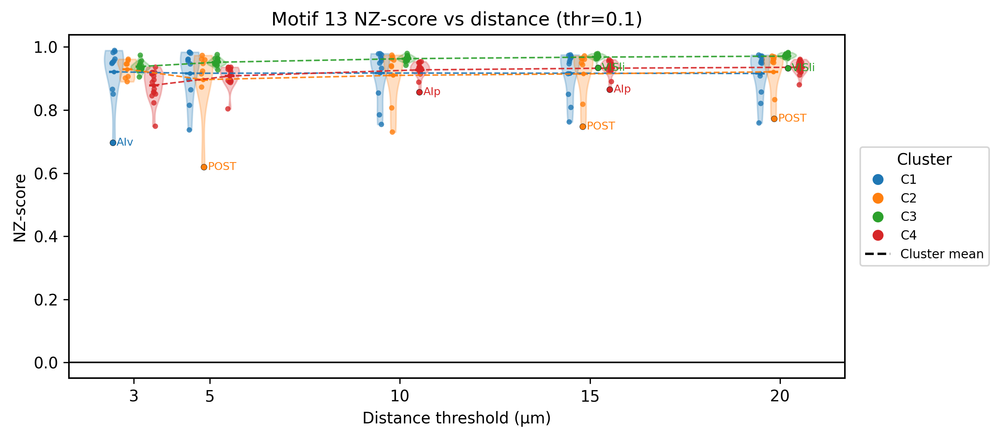

In [27]:
# ==================== 5. motif 2/7/8/13：按聚类类别随距离阈值变化的 NZ-score violin 图 + outlier 高亮 ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_list  = [3, 5, 10, 15, 20]      # 距离阈值
thr_use     = "0.1"                   # 强度阈值
motif_ids   = [2, 7, 8, 13]           # 要看的 motif（1-based）
unique_cls  = np.unique(labels)
n_clust     = len(unique_cls)
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# 预先缓存：在每个距离阈值下通过过滤的 NZ 向量
NZ_by_param = {p: {} for p in param_list}
for i, r in enumerate(names):
    for p in param_list:
        mr    = results_all[p][r]["motif_results"][thr_use]
        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue
        NZ_by_param[p][i] = np.asarray(mr["NZ"], float)

for m_id in motif_ids:
    j   = m_id - 1
    fig, ax = plt.subplots(figsize=(9, 4))
    width   = 0.35

    mean_x = {c: [] for c in unique_cls}
    mean_y = {c: [] for c in unique_cls}

    for ci, c in enumerate(unique_cls):
        offset         = (ci - (n_clust - 1) / 2) * width
        data_list      = []
        pos_list       = []
        names_by_group = []

        for p in param_list:
            idx_i = [i for i in range(len(names)) if labels[i] == c and i in NZ_by_param[p]]
            if not idx_i:
                continue
            vals         = np.array([NZ_by_param[p][i][j] for i in idx_i])
            region_group = [names[i] for i in idx_i]
            x_center     = p + offset

            data_list.append(vals)
            pos_list.append(x_center)
            names_by_group.append(region_group)
            mean_x[c].append(x_center)
            mean_y[c].append(vals.mean())

        if not data_list:
            continue

        parts = ax.violinplot(data_list, positions=pos_list,
                              showmeans=True, showextrema=False, showmedians=False)
        for body in parts["bodies"]:
            body.set_facecolor(cluster_col[c]); body.set_edgecolor(cluster_col[c]); body.set_alpha(0.25)

        for x0, vals, regs in zip(pos_list, data_list, names_by_group):
            q1, q3  = np.percentile(vals, [25, 75])
            iqr     = q3 - q1
            lower   = q1 - 3 * iqr
            upper   = q3 + 3 * iqr
            is_out  = (vals < lower) | (vals > upper)
            jitter  = (np.random.rand(len(vals)) - 0.5) * 0.1
            x_base  = np.full(len(vals), x0) + jitter

            ax.scatter(x_base[~is_out], vals[~is_out], s=12, alpha=0.8,
                       color=cluster_col[c], edgecolors="none")

            ax.scatter(x_base[is_out], vals[is_out], s=15, alpha=1.0,
                       facecolors=cluster_col[c], edgecolors="black",
                       linewidths=0.2, zorder=5)

            for xo, yo, name_out in zip(x_base[is_out], vals[is_out], np.array(regs)[is_out]):
                ax.text(xo + 0.1, yo, name_out, fontsize=7,
                        va="center", ha="left", color=cluster_col[c])

    for c in unique_cls:
        xs = np.array(mean_x[c]); ys = np.array(mean_y[c])
        if len(xs) == 0:
            continue
        idx = np.argsort(xs)
        ax.plot(xs[idx], ys[idx], color=cluster_col[c], linewidth=1,
                alpha=0.9, linestyle="--", marker="o", markersize=2,
                label=f"C{int(c)} mean" if m_id == motif_ids[0] else None)

    ax.axhline(0, color="k", lw=1)
    ax.set_xlabel("Distance threshold (µm)")
    ax.set_ylabel("NZ-score")
    ax.set_title(f"Motif {m_id} NZ-score vs distance (thr={thr_use})")
    ax.set_xticks(param_list); ax.set_xticklabels([str(p) for p in param_list])

    handles = [plt.Line2D([0], [0], marker="o", linestyle="",
                           color=cluster_col[c], label=f"C{int(c)}")
               for c in unique_cls]
    handles += [plt.Line2D([0], [0], color="k", linestyle="--", label="Cluster mean")]

    ax.legend(handles=handles, title="Cluster", fontsize=8,
              loc="center left", bbox_to_anchor=(1.02, 0.5), borderaxespad=0.0)

    plt.tight_layout()
    plt.savefig(f"7.motif{m_id}_NZ_vs_param.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

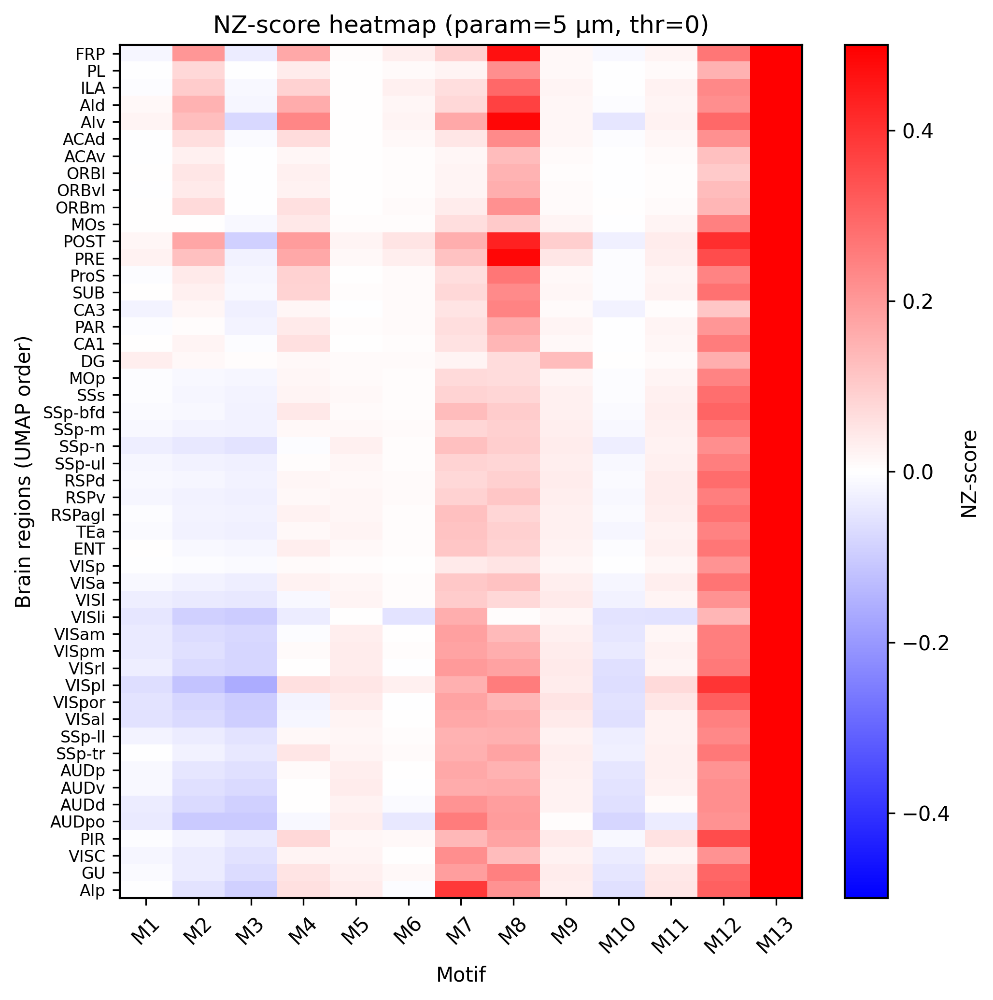

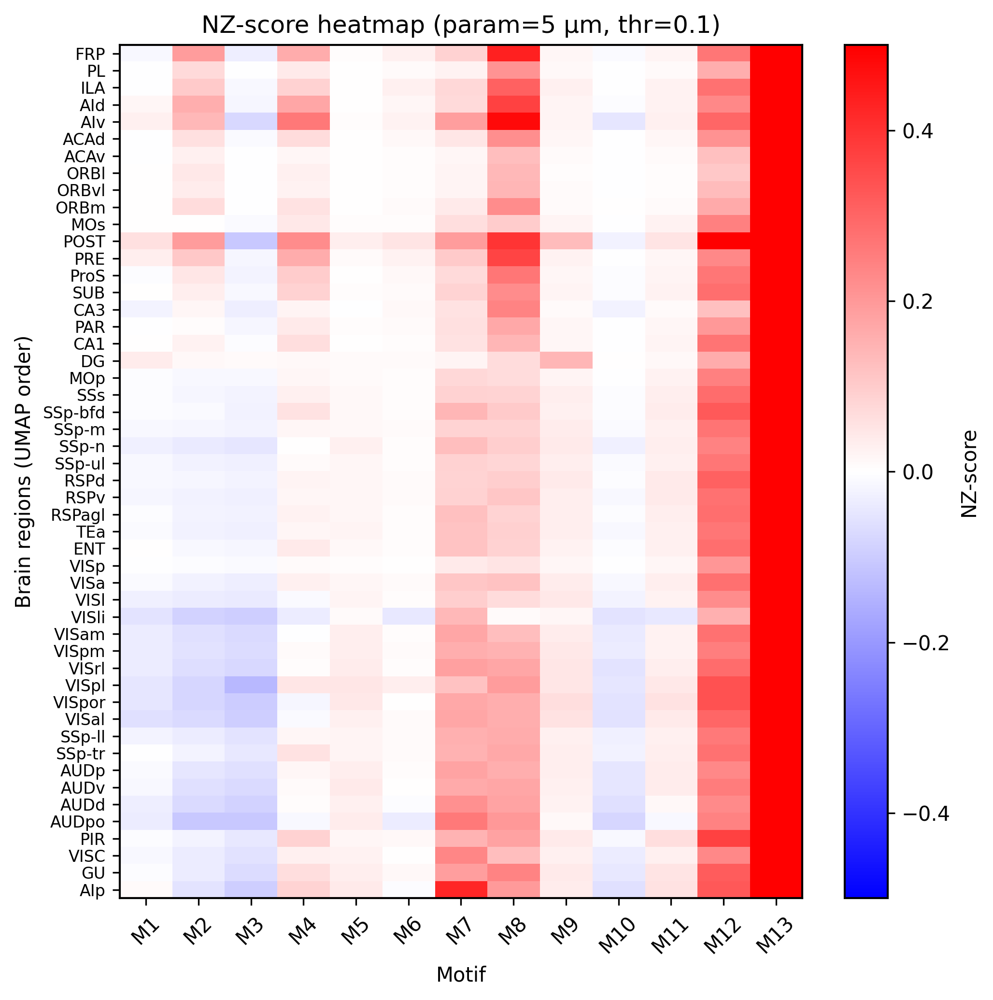

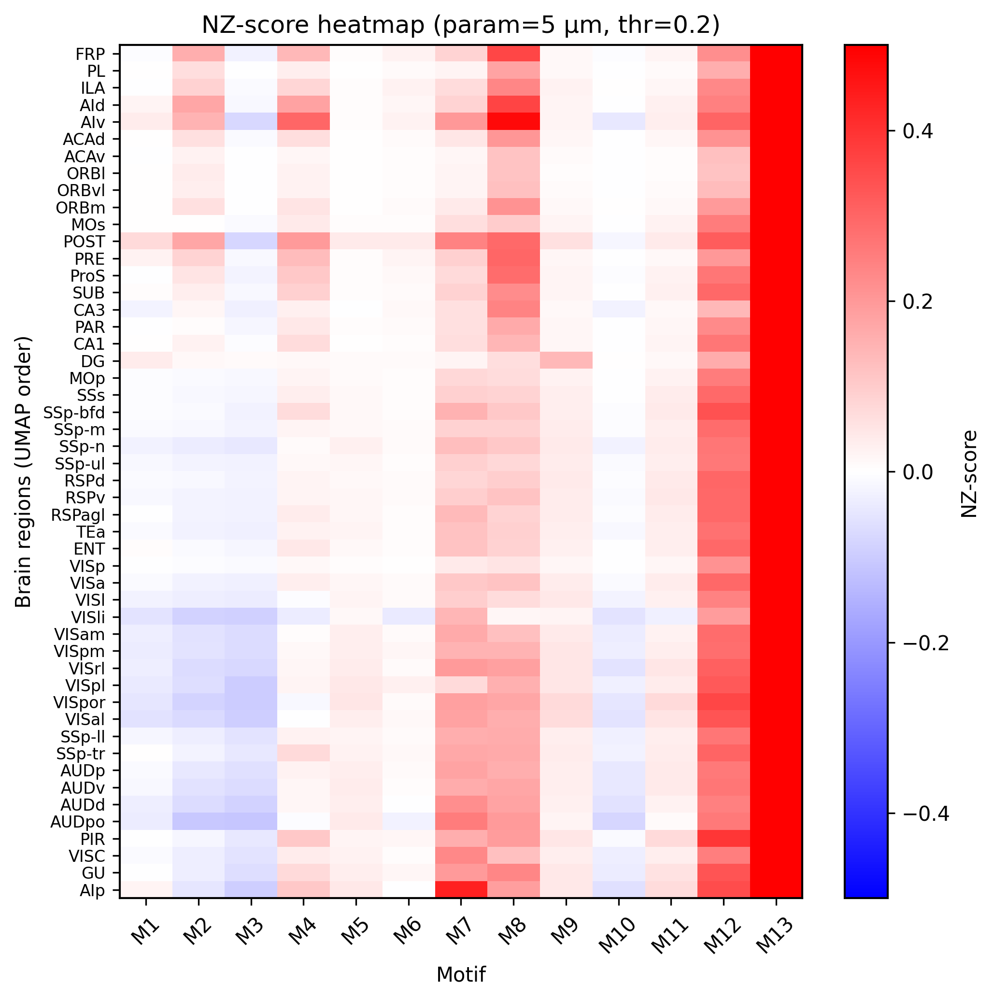

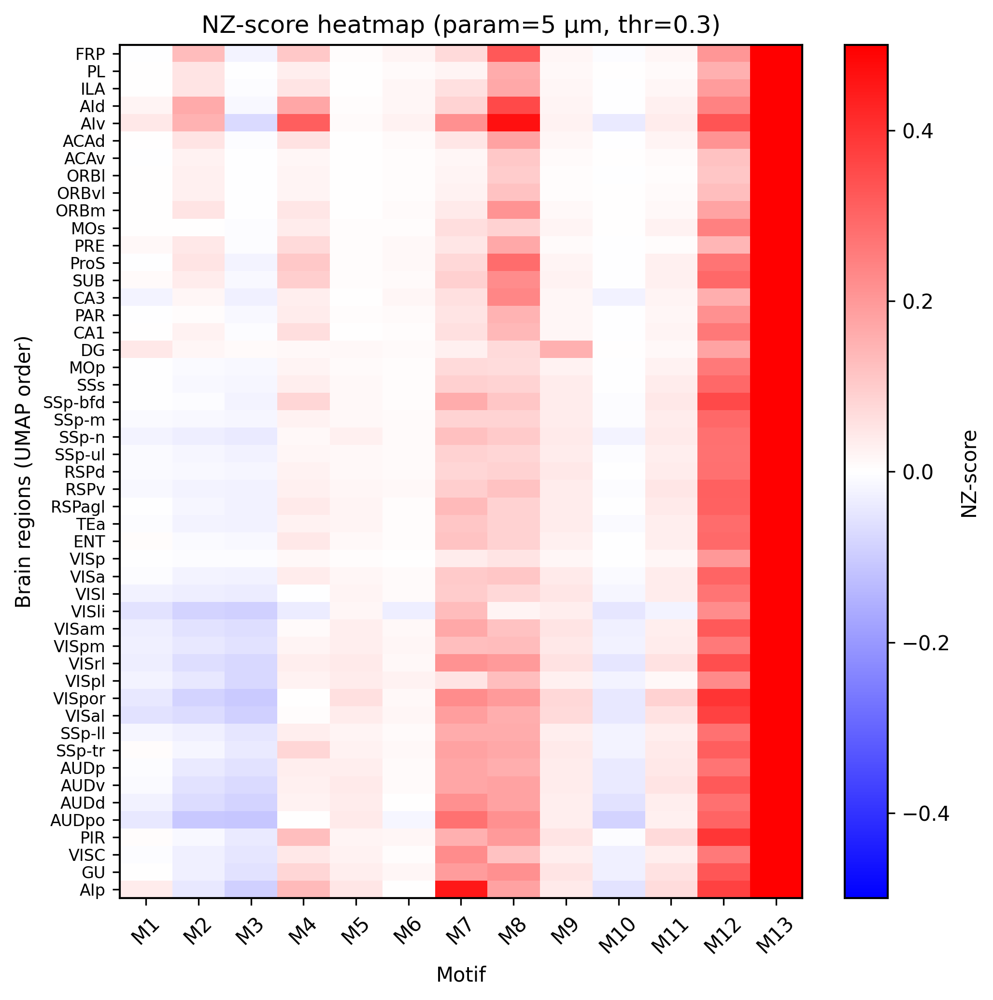

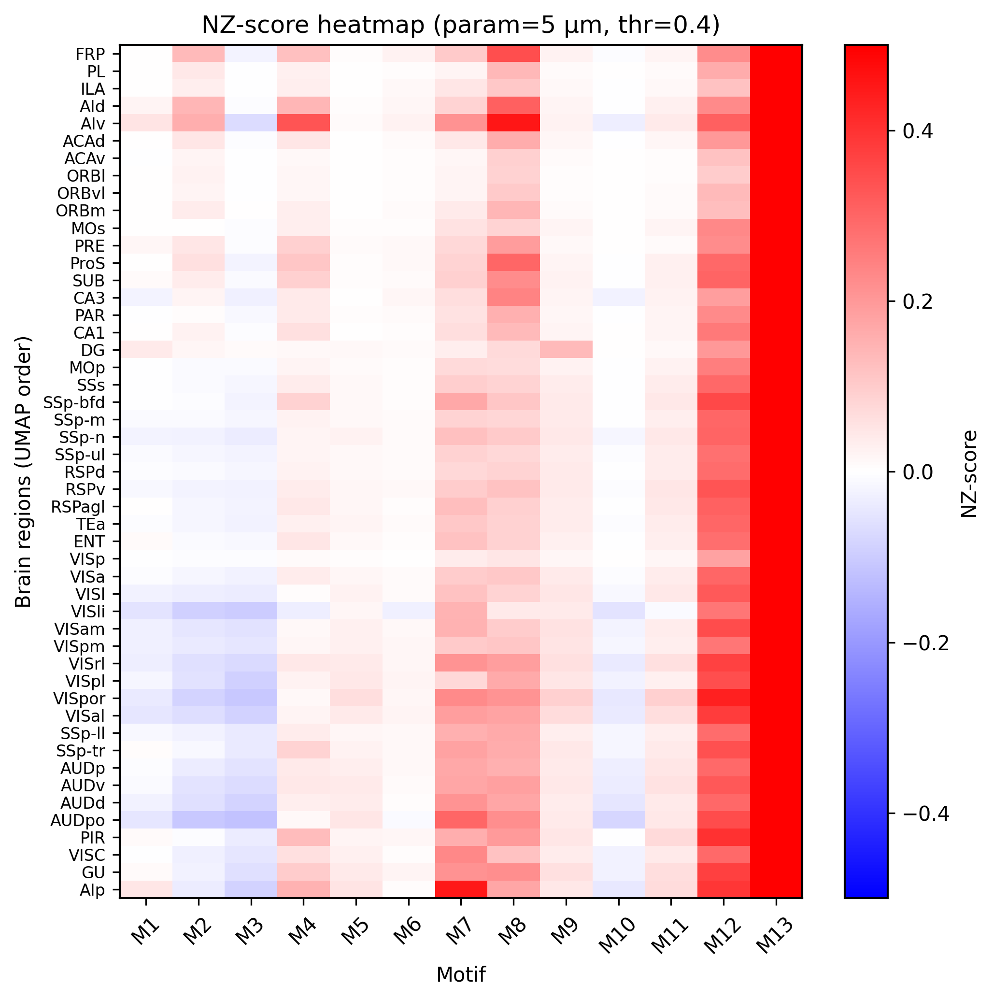

In [36]:
# ==================== 5. 固定 5 µm，遍历不同强度阈值画 NZ-score 热图 ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_fix = 5
thr_list  = ["0", "0.1", "0.2", "0.3", "0.4"]   # 你数据里那 5 个强度阈值

for thr_use in thr_list:
    NZ_rows = []
    region_rows = []

    for r in names:   # names 是前面按 UMAP+层次聚类排好序的脑区列表
        info = results_all[param_fix][r]
        mr   = info["motif_results"].get(thr_use)
        if mr is None:
            continue

        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)

        # 过滤条件：real_motif 所有元素 >=0.9，且 mu_mc 前 12 个都 >0
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            continue

        nz = np.asarray(mr["NZ"], float)   # 13 维 NZ-score
        NZ_rows.append(nz)
        region_rows.append(r)

    if not NZ_rows:
        print(f"[INFO] param={param_fix} µm, thr={thr_use} 下没有满足条件的脑区，跳过绘图")
        continue

    NZ_mat = np.vstack(NZ_rows)

    plt.figure(figsize=(7, 7))
    im = plt.imshow(NZ_mat, aspect="auto", cmap="bwr", vmin=-0.5, vmax=0.5)

    plt.colorbar(im, label="NZ-score")
    plt.yticks(range(len(region_rows)), region_rows, fontsize=8)
    plt.xticks(range(13), [f"M{i+1}" for i in range(13)], rotation=45)

    plt.title(f"NZ-score heatmap (param={param_fix} µm, thr={thr_use})"
)
    plt.xlabel("Motif")
    plt.ylabel("Brain regions (UMAP order)")

    plt.tight_layout()
    plt.savefig(f"9.wb_motif_NZ_strength_{thr_use}.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

有效脑区数（所有强度阈值都通过过滤）: 49


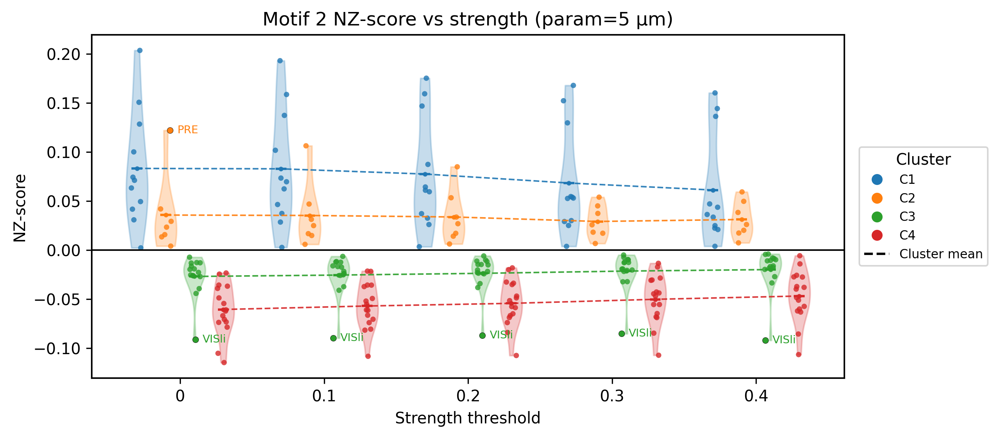

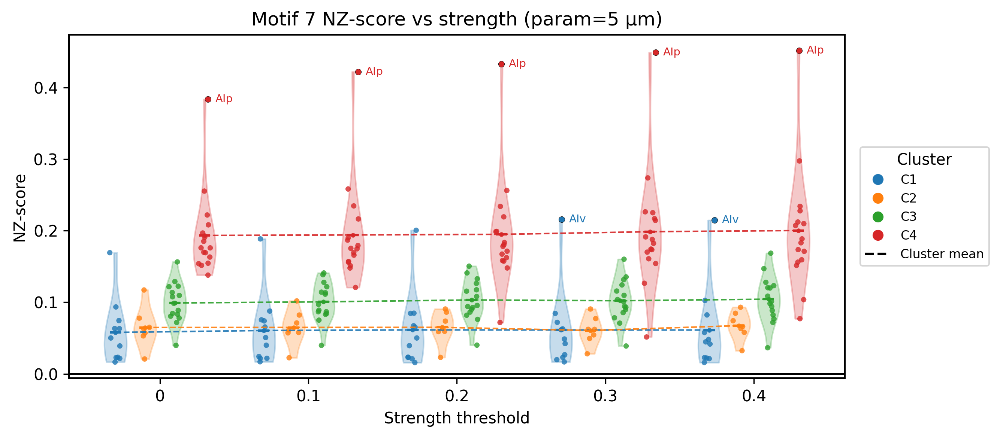

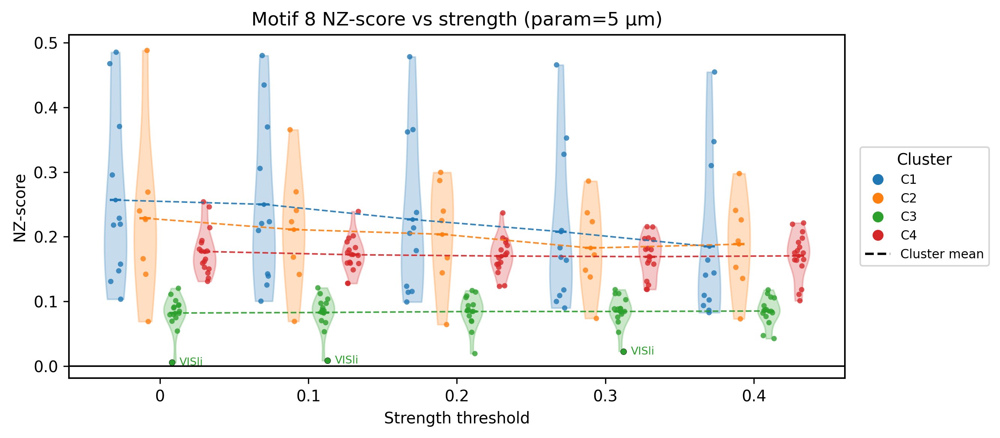

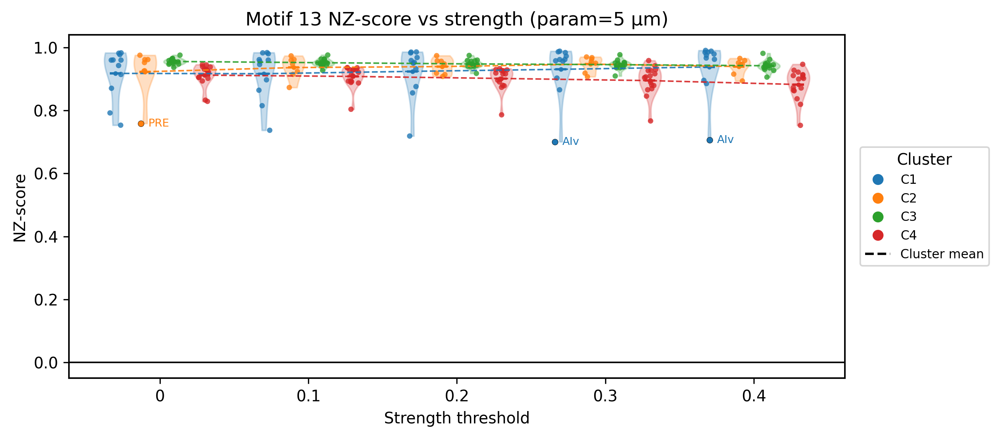

In [29]:
# ==================== motif 2/7/8/13：按聚类类别、随强度阈值变化的 NZ-score violin 图（全阈值一致过滤） ====================

import pickle
import numpy as np
import matplotlib.pyplot as plt

with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_use   = 5                                    # 固定距离阈值 5 µm
thr_list    = ["0", "0.1", "0.2", "0.3", "0.4"]    # 不同强度阈值（motif_results 的 key）
x_thr       = np.arange(len(thr_list))             # x 轴：0,1,2,3,4

motif_ids   = [2, 7, 8, 13]                        # 要看的 motif（1-based）
unique_cls  = np.unique(labels)                    # 来自之前 UMAP+聚类
n_clust     = len(unique_cls)
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# ---------- 1) 先根据“所有强度阈值”一起过滤，选出 valid_idx ----------
valid_idx = []
for i, r in enumerate(names):
    ok = True
    for thr in thr_list:
        mr    = results_all[param_use][r]["motif_results"][thr]
        real  = np.asarray(mr["real_motif"], float)
        mu_mc = np.asarray(mr["er_mu_mc"], float)
        if np.any(real < 0.9) or np.any(mu_mc[:12] <= 0.0):
            ok = False
            break
    if ok:
        valid_idx.append(i)

print(f"有效脑区数（所有强度阈值都通过过滤）: {len(valid_idx)}")

# ---------- 2) 缓存各强度阈值下的 NZ（只对 valid_idx） ----------
NZ_by_thr = {thr: {} for thr in thr_list}
for i in valid_idx:
    r = names[i]
    for thr in thr_list:
        mr = results_all[param_use][r]["motif_results"][thr]
        NZ_by_thr[thr][i] = np.asarray(mr["NZ"], float)   # 13 维

# ---------- 3) 对每个 motif 画一张 violin + outlier + 均值虚线 ----------
for m_id in motif_ids:
    j = m_id - 1   # 0-based index

    fig, ax = plt.subplots(figsize=(9, 4))
    width   = 0.20   # 不同 cluster 在同一强度上的横向偏移

    # 记录 cluster 在不同强度阈值下的均值
    mean_x = {c: [] for c in unique_cls}
    mean_y = {c: [] for c in unique_cls}

    for ci, c in enumerate(unique_cls):
        offset         = (ci - (n_clust - 1) / 2.) * width
        data_list      = []   # 当前 cluster 在不同强度阈值下的一组组值
        pos_list       = []   # 每组的 x 位置
        names_by_group = []   # 每组对应的脑区名

        for ti, thr in enumerate(thr_list):
            # 限制在 valid_idx 之内 & 当前 cluster
            idx_i = [
                i for i in valid_idx
                if labels[i] == c and i in NZ_by_thr[thr]
            ]
            if not idx_i:
                continue

            vals = np.array([NZ_by_thr[thr][i][j] for i in idx_i])
            regs = [names[i] for i in idx_i]
            x_center = x_thr[ti] + offset

            data_list.append(vals)
            pos_list.append(x_center)
            names_by_group.append(regs)

            mean_x[c].append(x_center)
            mean_y[c].append(vals.mean())

        if not data_list:
            continue

        # violin：同一 cluster、不同强度阈值的分布
        parts = ax.violinplot(
            data_list,
            positions=pos_list,
            widths=0.15,
            showmeans=True,
            showextrema=False,
            showmedians=False,
        )
        for body in parts["bodies"]:
            body.set_facecolor(cluster_col[c])
            body.set_edgecolor(cluster_col[c])
            body.set_alpha(0.25)

        # 点 + outlier 高亮
        for x0, vals, regs in zip(pos_list, data_list, names_by_group):
            q1, q3 = np.percentile(vals, [25, 75])
            iqr    = q3 - q1
            lower  = q1 - 3 * iqr
            upper  = q3 + 3 * iqr
            is_out = (vals < lower) | (vals > upper)

            jitter = (np.random.rand(len(vals)) - 0.5) * 0.08
            x_base = np.full(len(vals), x0) + jitter

            # 普通点
            ax.scatter(
                x_base[~is_out], vals[~is_out],
                s=12, alpha=0.8,
                color=cluster_col[c], edgecolors="none",
            )

            # outlier 点 + 标名字
            ax.scatter(
                x_base[is_out], vals[is_out],
                s=15, alpha=1.0,
                facecolors=cluster_col[c],
                edgecolors="black",
                linewidths=0.2,
                zorder=5,
            )
            for xo, yo, name_out in zip(x_base[is_out], vals[is_out], np.array(regs)[is_out]):
                ax.text(
                    xo + 0.05, yo, name_out,
                    fontsize=7,
                    va="center", ha="left",
                    color=cluster_col[c],
                )

    # 画 cluster 均值虚线（x 用 x_center，自动对齐 violin）
    for c in unique_cls:
        xs = np.array(mean_x[c]); ys = np.array(mean_y[c])
        if len(xs) == 0:
            continue
        order = np.argsort(xs)
        ax.plot(
            xs[order], ys[order],
            color=cluster_col[c],
            linewidth=1,
            alpha=0.9,
            linestyle="--",
            marker="o",
            markersize=2,
        )

    ax.axhline(0, color="k", lw=1)
    ax.set_xlabel("Strength threshold")
    ax.set_ylabel("NZ-score")
    ax.set_title(f"Motif {m_id} NZ-score vs strength (param={param_use} µm)")

    ax.set_xticks(x_thr)
    ax.set_xticklabels(thr_list)

    # 颜色 = cluster；虚线 = cluster mean
    handles = [
        plt.Line2D([0], [0], marker="o", linestyle="",
                   color=cluster_col[c], label=f"C{int(c)}")
        for c in unique_cls
    ] + [
        plt.Line2D([0], [0], color="k", linestyle="--", label="Cluster mean")
    ]
    ax.legend(
        handles=handles,
        title="Cluster",
        fontsize=8,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        borderaxespad=0.0,
    )

    plt.tight_layout()
    plt.savefig(f"9.motif{m_id}_NZ_vs_strength.svg",
                 bbox_inches="tight", transparent=True)
    plt.show()

In [15]:
import pickle
import numpy as np

pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]

res_5 = results_all[5]   # 5 µm

all_w = []

for region, info in res_5.items():
    # 假设 info["sc"] 就是加权连接矩阵；如果是 dict，就改成相应的 key
    W = np.asarray(info["sc"], float)

    # 去掉对角线 & 只保留 >0 的连接
    mask = ~np.eye(W.shape[0], dtype=bool)
    vals = W[mask]
    vals = vals[vals > 0]

    if vals.size:
        all_w.append(vals)

all_w = np.concatenate(all_w)

# 选择截断分位数：比如 99 分位数
q = 95
cut = np.percentile(all_w, q)

w_plot = all_w[all_w <= cut]

print(f"总连接数: {all_w.size}")
print(f"{q}th 分位数截断值: {cut:.4g}")
print(f"截断后剩余: {w_plot.size}")

总连接数: 1443616
95th 分位数截断值: 28.01
截断后剩余: 1371435


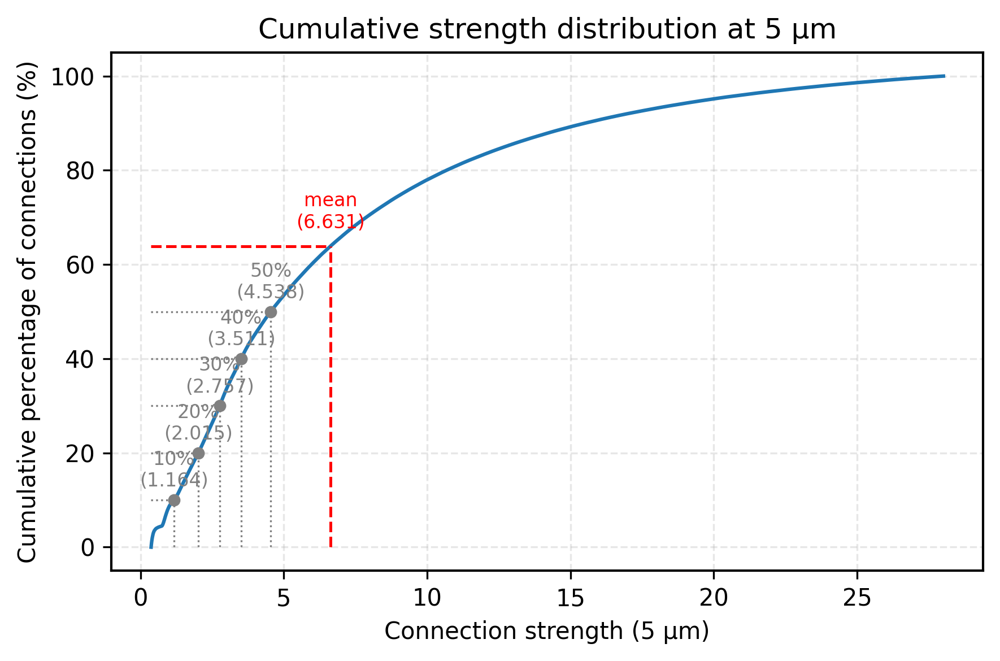

In [30]:
import numpy as np
import matplotlib.pyplot as plt

# w_plot：已经长尾截断好的边强度

# === 用排序后的数据画经验 CDF（更平滑）===
w_sorted = np.sort(w_plot)
n = len(w_sorted)
cum_pct = np.arange(1, n + 1) / n * 100  # 1 ~ 100%

plt.figure(figsize=(6, 4))
plt.plot(w_sorted, cum_pct, linewidth=1.5)
plt.xlabel("Connection strength (5 µm)")
plt.ylabel("Cumulative percentage of connections (%)")
plt.title("Cumulative strength distribution at 5 µm")
plt.grid(True, linestyle="--", alpha=0.3)

x_min = w_sorted[0]

# ---- 用精确分位数来标点：x=分位数强度, y=对应百分位 ----
q_levels = np.array([10, 20, 30, 40, 50])          # 百分位
q_vals   = np.quantile(w_plot, q_levels / 100.0)   # 对应的强度

for q_perc, qx in zip(q_levels, q_vals):
    cy = q_perc

    # 竖线
    plt.plot([qx, qx], [0, cy],
             color="gray", linestyle=":", linewidth=0.8)
    # 横线
    plt.plot([x_min, qx], [cy, cy],
             color="gray", linestyle=":", linewidth=0.8)

    plt.scatter([qx], [cy], color="gray", s=18, zorder=5)
    # ✅ 标注百分位 + 对应的强度数值
    plt.text(
        qx, cy + 2,
        f"{q_perc}%\n({qx:.3f})",   # 比如：10%\n(0.023)
        ha="center", va="bottom",
        fontsize=8, color="gray",
    )

# ---- 均值的位置：x=mean, y=均值在经验分布中的百分位 ----
mu = w_plot.mean()
rank = np.searchsorted(w_sorted, mu, side="right")
cy_mean = rank / n * 100.0

plt.plot([mu, mu], [0, cy_mean],
         color="red", linestyle="--", linewidth=1.2)
plt.plot([x_min, mu], [cy_mean, cy_mean],
         color="red", linestyle="--", linewidth=1.2)

# ✅ 均值也标注具体数值
plt.text(
    mu, cy_mean + 3,
    f"mean\n({mu:.3f})",
    ha="center", va="bottom",
    fontsize=8, color="red",
)

plt.tight_layout()
plt.savefig(f"8.wb_strength_cum_5um.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

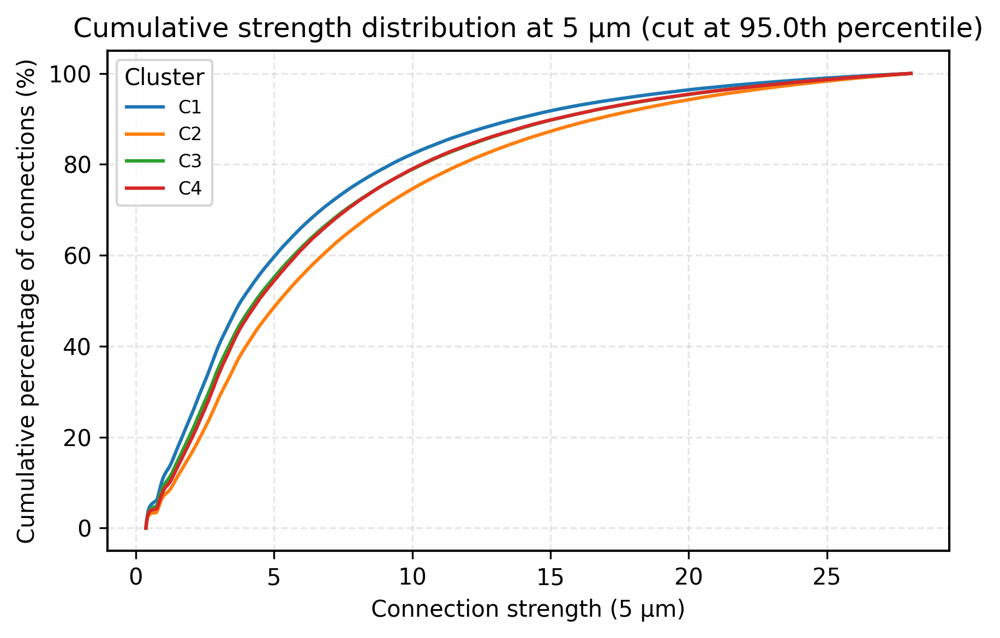

In [31]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 1. 读数据 & 基本信息 =====
with open("wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl", "rb") as f:
    results_all = pickle.load(f)["results"]

param_use  = 5          # 5 µm
unique_cls = np.unique(labels)      # 之前 UMAP + 聚类得到的 labels / names
cluster_col = {c: plt.cm.tab10((c - 1) % 10) for c in unique_cls}

# ===== 2. 按 cluster 收集 5µm 的所有非零权重 =====
weights_by_cluster = {c: [] for c in unique_cls}

for r, c in zip(names, labels):
    sc = np.asarray(results_all[param_use][r]["sc"], float)  # 5 µm 下的连接矩阵
    w  = sc.ravel()
    w  = w[w > 0]   # 只保留非零边
    if w.size:
        weights_by_cluster[c].append(w)

for c in unique_cls:
    if weights_by_cluster[c]:
        weights_by_cluster[c] = np.concatenate(weights_by_cluster[c])
    else:
        weights_by_cluster[c] = np.array([])

# ===== 3. 全局长尾截断（统一一个上限，方便比较）=====
q_tail = 0.95
all_w  = np.concatenate([w for w in weights_by_cluster.values() if w.size])
cut    = np.quantile(all_w, q_tail)

for c in unique_cls:
    w = weights_by_cluster[c]
    weights_by_cluster[c] = w[(w > 0) & (w <= cut)]

# ===== 4. 在同一张图里画 4 条 ECDF 曲线 =====
plt.figure(figsize=(6, 4))

for c in unique_cls:
    w = weights_by_cluster[c]
    if w.size == 0:
        continue

    w_sorted = np.sort(w)
    n        = len(w_sorted)
    cum_pct  = np.arange(1, n + 1) / n * 100  # 0–100%

    plt.plot(
        w_sorted, cum_pct,
        color=cluster_col[c],
        linewidth=1.5,
        label=f"C{int(c)}"
    )

plt.xlabel("Connection strength (5 µm)")
plt.ylabel("Cumulative percentage of connections (%)")
plt.title(f"Cumulative strength distribution at 5 µm (cut at {q_tail*100:.1f}th percentile)")
plt.grid(True, linestyle="--", alpha=0.3)
plt.legend(title="Cluster", fontsize=8)
plt.tight_layout()
plt.savefig(f"8.cluster_strength_cum_5um.svg",
                 bbox_inches="tight", transparent=True)
plt.show()

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# ===== 0. 读数据（5 µm, thr="0"）=====
pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"
with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]

param_use = 5
thr_use   = "0"
res5      = results_all[param_use]   # dict: region -> info

# ==================== 1. 在这里重新生成 names 和 labels ====================

# 你给的 4 个 cluster 顺序
cluster1_names = [
    "FRP",
    "PL",
    "ILA",
    "AId",
    "AIv",
    "ACAd",
    "ACAv",
    "ORBl",
    "ORBvl",
    "ORBm",
    "MOs",
]

cluster2_names = [
    "POST",
    "PRE",
    "ProS",
    "SUB",
    "CA3",
    "PAR",
    "CA1",
    "DG",
]

cluster3_names = [
    "MOp",
    "SSs",
    "SSp-bfd",
    "SSp-m",
    "SSp-n",
    "SSp-ul",
    "RSPd",
    "RSPv",
    "RSPagl",
    "TEa",
    "ENT",
    "VISp",
    "VISa",
    "VISl",
    "VISli",
]

cluster4_names = [
    "VISam",
    "VISpm",
    "VISrl",
    "VISpl",
    "VISpor",
    "VISal",
    "SSp-ll",
    "SSp-tr",
    "AUDp",
    "AUDv",
    "AUDd",
    "AUDpo",
    "PIR",
    "VISC",
    "GU",
    "AIp",
]

# 所有在 pkl 里的 region 名字（过滤掉一些无效区域，按你之前的习惯）
all_regions = sorted(res5.keys())
exclude_regions = {"SSp", "VPL", "PERI", "ECT", "PO", "PR"}  # 你之前过滤的那几个
all_regions = [r for r in all_regions if r not in exclude_regions]

# 按你给的顺序拼起来
custom_order = (
    cluster1_names +
    cluster2_names +
    cluster3_names +
    cluster4_names
)

# 先按自定义顺序挑出“在数据里的”
ordered_names_list = [r for r in custom_order if r in all_regions]

# 如果 pkl 里还有别的区域，但你没在 4 个 cluster 里列出来，就附加在最后（cluster=0）
extra_regions = [r for r in all_regions if r not in ordered_names_list]
if extra_regions:
    print("[WARN] 这些区域在 pkl 里有，但没在 4 个 cluster 里列出，将作为 C0 附加在最后：")
    print(extra_regions)
    ordered_names_list += extra_regions

# 最终用的 names（这个顺序后面你还可以复用）
names = np.array(ordered_names_list, dtype=object)

# 构造 name -> cluster 映射
name_to_cluster = {}
for r in cluster1_names:
    name_to_cluster[r] = 1
for r in cluster2_names:
    name_to_cluster[r] = 2
for r in cluster3_names:
    name_to_cluster[r] = 3
for r in cluster4_names:
    name_to_cluster[r] = 4
for r in extra_regions:
    name_to_cluster[r] = 0  # 没在 4 个列表里的，标成 0 类

labels = np.array([name_to_cluster.get(r, 0) for r in names], dtype=int)

print("最终区域顺序 names =", names)
print("对应 cluster labels =", labels)

# ==================== 2. 一张图画所有 region 的 motif 柱状图 ====================

motif_labels = [f"M{i}" for i in range(1, 14)]
x = np.arange(13)

bar_w   = 0.18
col_real = "#0072B2"  # 蓝
col_mu   = "#E69F00"  # 橙
col_diff = "#009E73"  # 绿

n_reg = len(names)
fig, axes = plt.subplots(
    n_reg, 1,
    figsize=(7, 2.3 * n_reg),
    sharex=True
)

if n_reg == 1:
    axes = [axes]

for idx, ax in enumerate(axes):
    region = names[idx]
    c      = labels[idx]   # cluster 编号

    mr = res5[region]["motif_results"][thr_use]

    real = np.asarray(mr["real_motif"], float)
    mu   = np.asarray(mr["er_mu_eq"],   float)

    # 有些结果可能是长度 14（第 0 个占位），这里切掉第 0 元素
    if real.shape[0] == 14:
        real = real[1:]
    if mu.shape[0] == 14:
        mu = mu[1:]
    if real.shape[0] != 13 or mu.shape[0] != 13:
        ax.set_visible(False)
        continue

    # log2 变换（只对 >0 的做）
    log_real = np.full_like(real, np.nan, dtype=float)
    log_mu   = np.full_like(mu,   np.nan, dtype=float)

    mask_r = real > 0
    mask_m = mu   > 0
    log_real[mask_r] = np.log2(real[mask_r])
    log_mu[mask_m]   = np.log2(mu[mask_m])
    log_diff = log_real - log_mu

    # 三组柱子：real, mu, diff
    ax.bar(x - bar_w, log_real, width=bar_w,
           color=col_real, alpha=0.9,
           label="log2(real)" if idx == 0 else None)
    ax.bar(x,         log_mu,   width=bar_w,
           color=col_mu,   alpha=0.9,
           label="log2(er_mu_eq)" if idx == 0 else None)
    ax.bar(x + bar_w, log_diff, width=bar_w,
           color=col_diff, alpha=0.9,
           label="log2(real) - log2(mu_eq)" if idx == 0 else None)

    ax.axhline(0, color="k", lw=0.8)
    ax.set_ylabel("log2 / diff", fontsize=7)

    # 标题里带上 cluster 编号
    if c == 0:
        ax.set_title(f"{region} (C0)", loc="left", fontsize=8.5)
    else:
        ax.set_title(f"{region} (C{int(c)})", loc="left", fontsize=8.5)

    # 只在最后一行画 x 轴刻度
    if idx == n_reg - 1:
        ax.set_xticks(x)
        ax.set_xticklabels(motif_labels, rotation=45, ha="right", fontsize=8)
    else:
        ax.set_xticks([])
        ax.set_xticklabels([])

# 统一图例放在第一行
axes[0].legend(loc="upper right", fontsize=7)

fig.suptitle(
    f"All regions – log2(real), log2(er_mu_eq) and difference\n(5 µm, thr={thr_use})",
    fontsize=12, y=0.995
)

plt.tight_layout()

# 存成一张 SVG，透明底
fig.savefig(
    "cluster_motif_bar_all_regions.svg",
    bbox_inches='tight',
    dpi=300,
    transparent=True
)

plt.close(fig)

最终区域顺序 names = ['FRP' 'PL' 'ILA' 'AId' 'AIv' 'ACAd' 'ACAv' 'ORBl' 'ORBvl' 'ORBm' 'MOs'
 'POST' 'PRE' 'ProS' 'SUB' 'CA3' 'PAR' 'CA1' 'DG' 'RSPd' 'RSPv' 'RSPagl'
 'TEa' 'ENT' 'SSs' 'MOp' 'SSp-bfd' 'SSp-m' 'SSp-n' 'SSp-ul' 'VISp' 'VISa'
 'VISl' 'VISli' 'VISam' 'VISpm' 'VISrl' 'VISpl' 'VISpor' 'VISal' 'SSp-ll'
 'SSp-tr' 'AUDp' 'AUDv' 'AUDd' 'AUDpo' 'PIR' 'VISC' 'GU' 'AIp']
对应 cluster labels = [1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4]


FRP: 原节点 222, 用 100, 剩节点 83, 原边 343, 剩边 240 (砍掉最弱 30%)


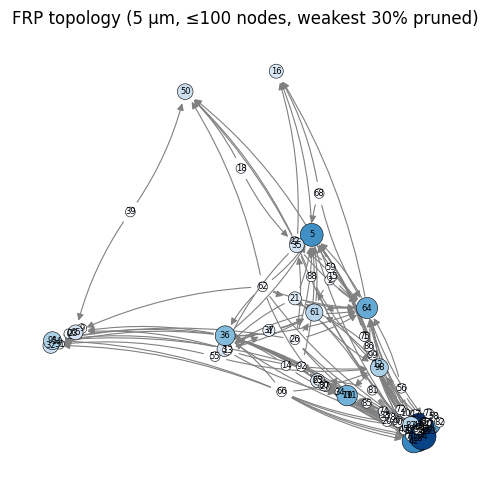

MOp: 原节点 957, 用 100, 剩节点 94, 原边 489, 剩边 342 (砍掉最弱 30%)


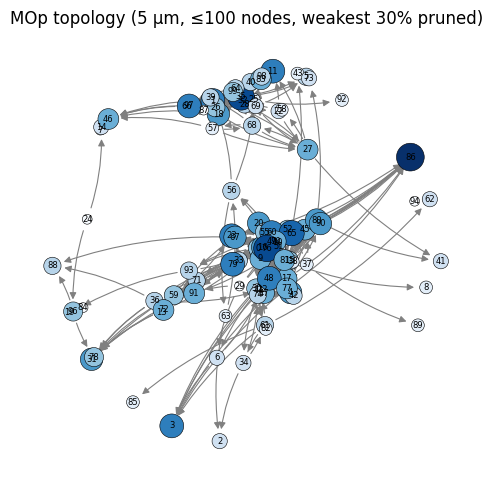

In [13]:
import pickle
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# ========== 1. 读 pkl，拿 5 µm 下的 FRP / MOp ==========

pkl_path = "wb_alltype_sc_results_dict_with_NZ_ES_norm.pkl"

with open(pkl_path, "rb") as f:
    results_all = pickle.load(f)["results"]   # dict[param] -> {region -> info}

param_use = 5
res_5um   = results_all[param_use]

A_frp_full = np.asarray(res_5um["FRP"]["sc"], dtype=float)
A_mop_full = np.asarray(res_5um["MOp"]["sc"], dtype=float)


# ========== 2. 子采样 + 去掉最弱若干百分比的边 + 去孤立点 + 画图 ==========

def sample_and_plot_topology(A_full, region_name, n_sample=100, drop_frac=0.1, seed=0):
    """
    A_full: 原始 n x n 加权有向邻接矩阵
    n_sample: 最多保留多少个节点
    drop_frac: 去掉的弱边比例（0.1 = 最弱 10%）
    """
    n_full = A_full.shape[0]
    n_use  = min(n_full, n_sample)

    # ----- 随机子采样节点 -----
    rng = np.random.default_rng(seed)
    idx = rng.choice(n_full, size=n_use, replace=False)
    A   = A_full[np.ix_(idx, idx)]

    # ----- 找非零边，砍掉最弱 drop_frac -----
    src, tgt = np.where(A > 0)
    if src.size == 0:
        print(f"{region_name}: 没有边，画不了。")
        return

    w = A[src, tgt]
    q = np.quantile(w, drop_frac)       # 比如 0.3 → 最弱 30%
    keep = w >= q

    src_keep = src[keep]
    tgt_keep = tgt[keep]

    # ----- 构图 -----
    G = nx.DiGraph()
    G.add_nodes_from(range(n_use))                 # 子采样后的节点编号 0..n_use-1
    G.add_edges_from(zip(src_keep, tgt_keep))

    # 去掉孤立节点
    isolates = [n for n, deg in G.degree() if deg == 0]
    G.remove_nodes_from(isolates)

    print(
        f"{region_name}: 原节点 {n_full}, 用 {n_use}, 剩节点 {G.number_of_nodes()}, "
        f"原边 {len(w)}, 剩边 {G.number_of_edges()} (砍掉最弱 {int(drop_frac*100)}%)"
    )

    if G.number_of_nodes() == 0:
        print(f"{region_name}: 全成孤立点了，图为空。")
        return

    # ======= spring 布局（稍微分散一点）=======
    n_nodes = G.number_of_nodes()
    k = 2.0 / np.sqrt(n_nodes)
    pos = nx.spring_layout(
        G,
        seed=seed,
        k=k,
        iterations=300,
        scale=2.0,
    )

    # ======= 入度控制点大小 & 颜色 =======
    indeg = np.array([d for _, d in G.in_degree()])
    d_min, d_max = indeg.min(), indeg.max()

    # 大小映射到 50–400
    if d_max == d_min:
        node_sizes = np.full_like(indeg, 150, dtype=float)
    else:
        node_sizes = 50 + (indeg - d_min) / (d_max - d_min) * 350

    # 颜色映射到 Blues：入度越大越深
    cmap = plt.cm.Blues
    if d_max == d_min:
        norm_deg = np.ones_like(indeg, dtype=float)
    else:
        norm_deg = (indeg - d_min) / (d_max - d_min)
    node_colors = [cmap(x) for x in norm_deg]

    # ----- 画图 -----
    plt.figure(figsize=(5, 5))
    ax = plt.gca()
    ax.set_axis_off()

    nx.draw_networkx_edges(
        G, pos,
        arrowstyle='-|>',
        arrowsize=10,
        edge_color="0.5",
        width=0.8,
        connectionstyle="arc3,rad=0.1",
    )

    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,    # ✅ 颜色体现入度
        node_size=node_sizes,      # ✅ 大小也体现入度
        edgecolors="black",
        linewidths=0.4,
    )

    labels = {nid: str(nid) for nid in G.nodes()}
    nx.draw_networkx_labels(G, pos, labels=labels, font_size=6)

    plt.title(
        f"{region_name} topology (5 µm, ≤{n_sample} nodes, "
        f"weakest {int(drop_frac*100)}% pruned)"
    )
    plt.tight_layout()
    plt.show()


# ========== 3. 画 FRP 和 MOp（各最多 100 个节点） ==========

sample_and_plot_topology(A_frp_full, "FRP", n_sample=100, drop_frac=0.3, seed=0)
sample_and_plot_topology(A_mop_full, "MOp", n_sample=100, drop_frac=0.3, seed=1)

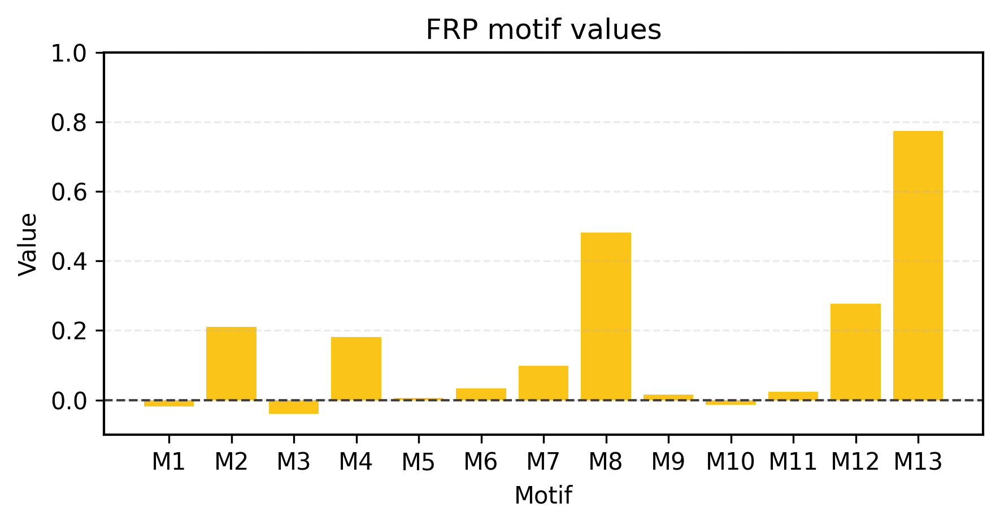

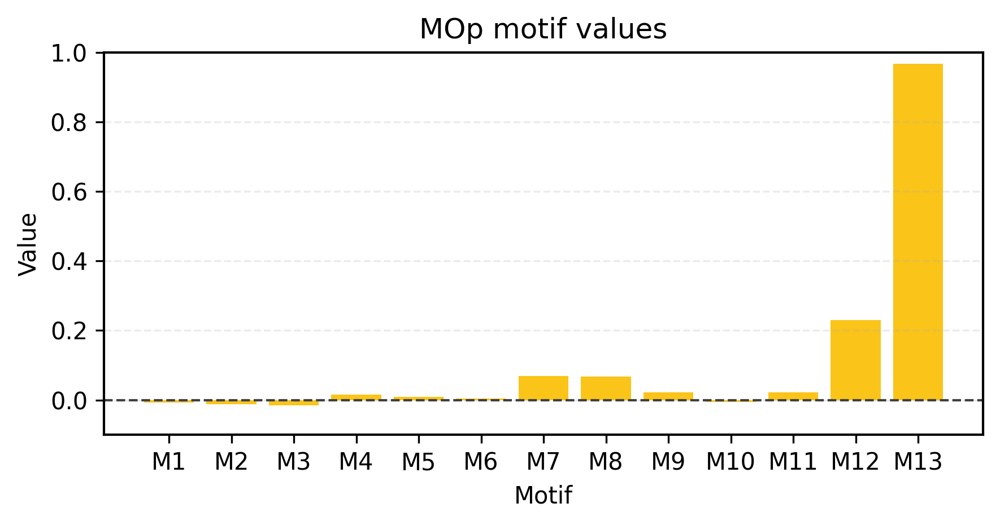

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ===== 全局论文风格 =====
mpl.rcParams.update({
    "figure.dpi": 300,
    "savefig.dpi": 300,
    "pdf.fonttype": 42,
    "ps.fonttype": 42,
    "font.size": 10,
    "axes.linewidth": 1.0,
})

# ===== 数据 =====
MOp = np.array([
    -0.00722737, -0.01273873, -0.01561858,  0.01562969,  0.00866638,
     0.00402705,  0.06961442,  0.06682548,  0.02137642, -0.00520205,
     0.02198735,  0.23077471,  0.96730022
], dtype=float)

FRP = np.array([
    -0.01928962,  0.20980253, -0.03922592,  0.1819576 ,  0.00601686,
     0.03389555,  0.09883095,  0.48222753,  0.01604604, -0.01396816,
     0.02385361,  0.2778669 ,  0.77410329
], dtype=float)

motif_ids = np.arange(1, 14)
x = np.arange(len(motif_ids))
xticklabels = [f"M{i}" for i in motif_ids]

# ===== 一个统一颜色（你要换就改这里）=====
COL_BAR = "#fabe00"  # 单一颜色

# ===== 统一 y 轴范围 =====
YMIN, YMAX = -0.1, 1.0

# =========================
# 图1：FRP 单独柱状图
# =========================
fig1, ax1 = plt.subplots(figsize=(6.0, 3.2))
ax1.bar(x, FRP, color=COL_BAR, alpha=0.9, linewidth=0)

ax1.set_ylim(YMIN, YMAX)
ax1.axhline(0, color="0.25", lw=1.0, linestyle="--")
ax1.set_xticks(x)
ax1.set_xticklabels(xticklabels)
ax1.set_xlabel("Motif")
ax1.set_ylabel("Value")
ax1.set_title("FRP motif values")
ax1.grid(axis="y", linestyle="--", alpha=0.25)

fig1.tight_layout()
fig1.savefig("FRP_motif_bars_singlecolor.svg", format="svg",
             bbox_inches="tight", transparent=True)
plt.show()

# =========================
# 图2：MOp 单独柱状图
# =========================
fig2, ax2 = plt.subplots(figsize=(6.0, 3.2))
ax2.bar(x, MOp, color=COL_BAR, alpha=0.9, linewidth=0)

ax2.set_ylim(YMIN, YMAX)
ax2.axhline(0, color="0.25", lw=1.0, linestyle="--")
ax2.set_xticks(x)
ax2.set_xticklabels(xticklabels)
ax2.set_xlabel("Motif")
ax2.set_ylabel("Value")
ax2.set_title("MOp motif values")
ax2.grid(axis="y", linestyle="--", alpha=0.25)

fig2.tight_layout()
fig2.savefig("MOp_motif_bars_singlecolor.svg", format="svg",
             bbox_inches="tight", transparent=True)
plt.show()